In [1]:
import numpy as np
import os 

isobins = np.linspace(0,10.,251)
isobins4 = np.linspace(0,4.,101)
#rhobins_eb = np.linspace(0,21.,8)
#rhobins_ee = np.linspace(0,25.,6)


# eta_regions = [
#     (rhobins_eb,"eb_low_eta","(abs(probe_eta)>=0 && abs(probe_eta)<0.9)"),
#     (rhobins_eb,"eb_high_eta","(abs(probe_eta)>=0.9 && abs(probe_eta)<1.5)"),
#     (rhobins_ee,"ee_low_eta","(abs(probe_eta)>1.5 && abs(probe_eta)<2)"),
#     (rhobins_ee,"ee_high_eta","(abs(probe_eta)>=2 && abs(probe_eta)<2.3)"),
#     (rhobins_ee,"ee_veryhigh_eta","(abs(probe_eta)>=2.3 && abs(probe_eta)<2.5)"),
# ]


data = ("exo/spring16/tnpTuples_ichep/Formatted_output_SingleElectron.root",
        "tnpAna/TaPTree")
mc   = ("exo/spring16/tnpTuples_ichep/Formatted_output_DYToEE_NNPDF30_13TeV-powheg-pythia8__63mb.root",
        "tnpAna/TaPTree")



In [2]:
eta_centers = np.linspace(0,2.5,21)

In [3]:
low = eta_centers[eta_centers!=1.5]-0.125

In [4]:
high = eta_centers[eta_centers!=1.5]+0.125

In [5]:
eta_overlap_regions =  np.array([low,high]).transpose()

In [6]:
eta_overlap_regions = np.array(filter(lambda x: (x>=0).all() and (x<=2.5).all(), eta_overlap_regions ))

In [7]:
eta_overlap_regions

array([[ 0.   ,  0.25 ],
       [ 0.125,  0.375],
       [ 0.25 ,  0.5  ],
       [ 0.375,  0.625],
       [ 0.5  ,  0.75 ],
       [ 0.625,  0.875],
       [ 0.75 ,  1.   ],
       [ 0.875,  1.125],
       [ 1.   ,  1.25 ],
       [ 1.125,  1.375],
       [ 1.25 ,  1.5  ],
       [ 1.5  ,  1.75 ],
       [ 1.625,  1.875],
       [ 1.75 ,  2.   ],
       [ 1.875,  2.125],
       [ 2.   ,  2.25 ],
       [ 2.125,  2.375],
       [ 2.25 ,  2.5  ]])

In [8]:
eta_overlap_regions.shape

(18, 2)

In [9]:
rho_centers_eb = np.linspace(0,25.5,18)
#rho_centers_eb = np.array([20])
rho_centers_eb

array([  0. ,   1.5,   3. ,   4.5,   6. ,   7.5,   9. ,  10.5,  12. ,
        13.5,  15. ,  16.5,  18. ,  19.5,  21. ,  22.5,  24. ,  25.5])

In [10]:
# low_eb  = rho_centers_eb-1.5
# high_eb = rho_centers_eb+1.5
low_eb  = rho_centers_eb-2.
high_eb = rho_centers_eb+2.

In [11]:
rho_overlap_regions_eb = np.array(filter(lambda x: (x>=0).all() and (x<26).all(), np.array([low_eb,high_eb]).transpose() ))

In [12]:
rho_overlap_regions_eb[-1,1] = 50
rho_overlap_regions_eb

array([[  1. ,   5. ],
       [  2.5,   6.5],
       [  4. ,   8. ],
       [  5.5,   9.5],
       [  7. ,  11. ],
       [  8.5,  12.5],
       [ 10. ,  14. ],
       [ 11.5,  15.5],
       [ 13. ,  17. ],
       [ 14.5,  18.5],
       [ 16. ,  20. ],
       [ 17.5,  21.5],
       [ 19. ,  23. ],
       [ 20.5,  50. ]])

In [13]:
rho_centers_ee = np.linspace(0,25,11)
#rho_centers_ee = np.array([20])
rho_centers_ee

array([  0. ,   2.5,   5. ,   7.5,  10. ,  12.5,  15. ,  17.5,  20. ,
        22.5,  25. ])

In [14]:
low_ee  = rho_centers_ee-2.5
high_ee = rho_centers_ee+2.5

In [15]:
rho_overlap_regions_ee = np.array(filter(lambda x: (x>=0).all() and (x<26).all(), np.array([low_ee,high_ee]).transpose() ))

In [16]:
rho_overlap_regions_ee[-1,1] = 50
rho_overlap_regions_ee

array([[  0. ,   5. ],
       [  2.5,   7.5],
       [  5. ,  10. ],
       [  7.5,  12.5],
       [ 10. ,  15. ],
       [ 12.5,  17.5],
       [ 15. ,  20. ],
       [ 17.5,  22.5],
       [ 20. ,  50. ]])

In [17]:
def mk_region_tuple(reg):
    rhob = rho_overlap_regions_eb if (reg<=1.5).all() else rho_overlap_regions_ee
    name = ("eta_%1.3f_%1.3f" % ( reg[0], reg[1] )).replace(".","p") 
    cut = "abs(probe_eta) >= %1.3f && abs(probe_eta) < %1.3f" % ( reg[0], reg[1] )
    return rhob, name,cut
    
arg_list = map(lambda x: (os.path.join(os.getcwd(),"photonIsoCorrect"),(data,mc,x[0], isobins, x[1], x[2] ),
                          #dict()),
                          dict(sameMult=True,multOffset=0)),
                map(mk_region_tuple, eta_overlap_regions))

In [18]:
len(arg_list)

18

In [19]:
import ipyparallel as ipp
rc = ipp.Client(profile="short")

## v = rc.load_balanced_view()
dv = rc[:len(arg_list)]
dv.activate()
rc.ids
dv.scatter('args',arg_list)
dv.targets

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

In [20]:
%%px --noblock
%matplotlib inline 

lib,fargs,kwargs = args[0]

from import_file import import_file
pic = import_file(lib)

result = pic.runEtaBin(*fargs,**kwargs)
result

<AsyncResult: execute>

[stdout:0] 
Welcome to ROOTaaS 6.06/08
<ROOT.TTree object ("TaPTree") at 0x68a0b80> hdata_
hdata_eta_0p000_0p250_1p00_5p00
hdata_eta_0p000_0p250_2p50_6p50
hdata_eta_0p000_0p250_4p00_8p00
hdata_eta_0p000_0p250_5p50_9p50
hdata_eta_0p000_0p250_7p00_11p00
hdata_eta_0p000_0p250_8p50_12p50
hdata_eta_0p000_0p250_10p00_14p00
hdata_eta_0p000_0p250_11p50_15p50
hdata_eta_0p000_0p250_13p00_17p00
hdata_eta_0p000_0p250_14p50_18p50
hdata_eta_0p000_0p250_16p00_20p00
hdata_eta_0p000_0p250_17p50_21p50
hdata_eta_0p000_0p250_19p00_23p00
hdata_eta_0p000_0p250_20p50_50p00
<ROOT.TTree object ("TaPTree") at 0x69715d0> hmc_
hmc_eta_0p000_0p250_1p00_5p00
hmc_eta_0p000_0p250_2p50_6p50
hmc_eta_0p000_0p250_4p00_8p00
hmc_eta_0p000_0p250_5p50_9p50
hmc_eta_0p000_0p250_7p00_11p00
hmc_eta_0p000_0p250_8p50_12p50
hmc_eta_0p000_0p250_10p00_14p00
hmc_eta_0p000_0p250_11p50_15p50
hmc_eta_0p000_0p250_13p00_17p00
hmc_eta_0p000_0p250_14p50_18p50
hmc_eta_0p000_0p250_16p00_20p00
hmc_eta_0p000_0p250_17p50_21p50
hmc_eta_0p000_0p250

[stderr:0] 
/mnt/t3nfs01/data01/shome/musella/miniconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
Error in <TAxis::TAxis::Set>: bins must be in increasing order
Error in <TAxis::TAxis::Set>: bins must be in increasing order
[stderr:1] 
/mnt/t3nfs01/data01/shome/musella/miniconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
Error in <TAxis::TAxis::Set>: bins must be in increasing order
Error in <TAxis::TAxis::Set>: bins must be in increasing order
[stderr:2] 
/mnt/t3nfs01/data01/shome/musella/miniconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
Error in <TAxis:

[output:0]

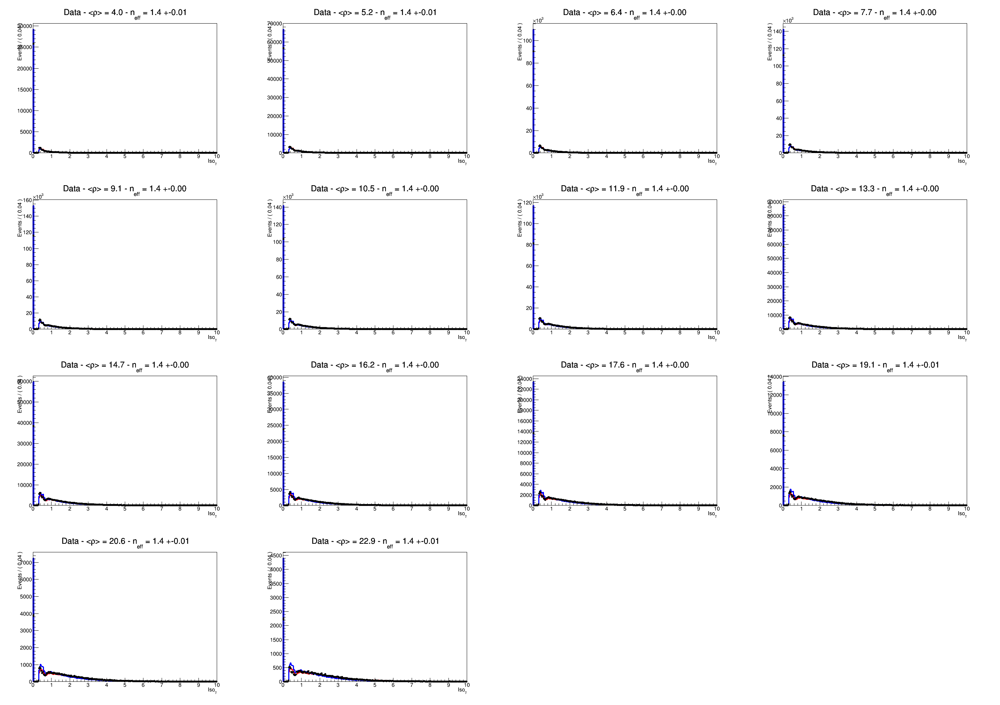

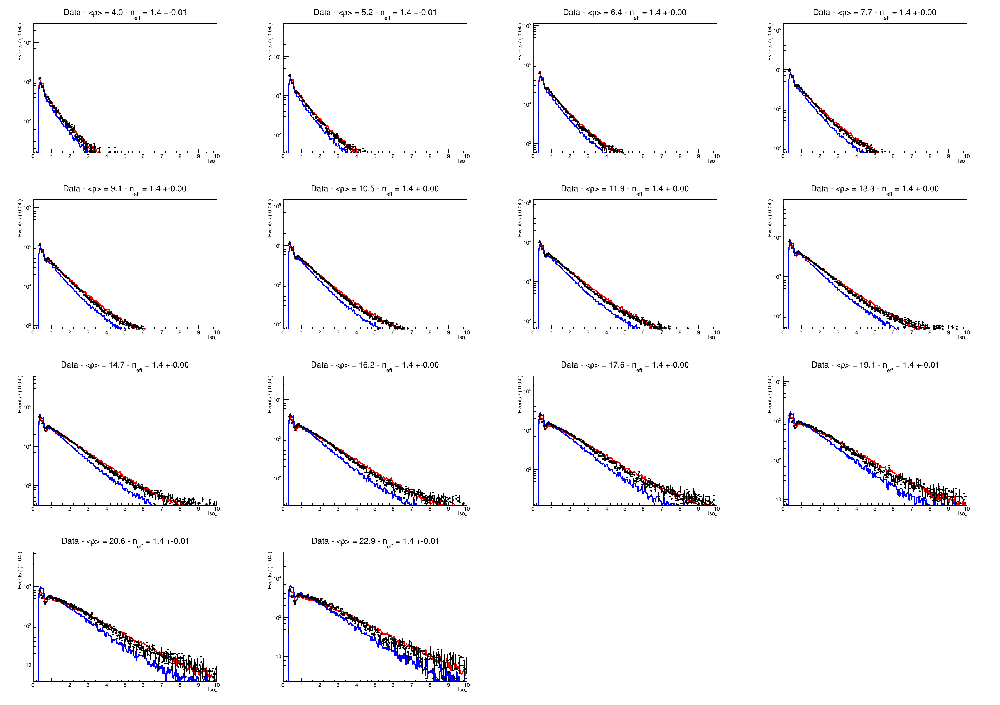

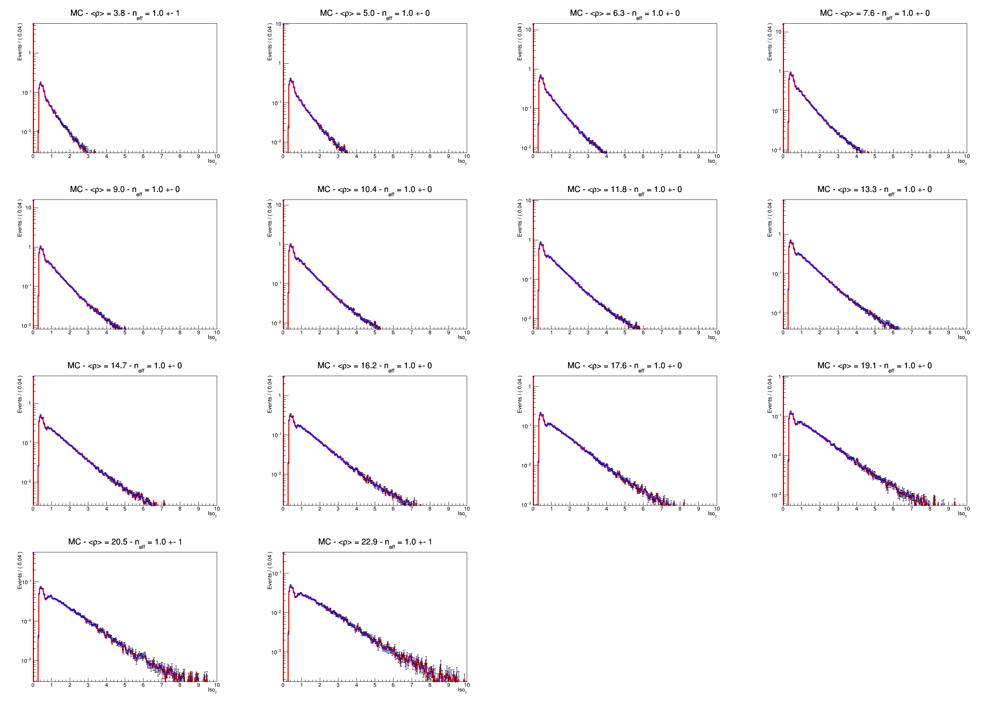

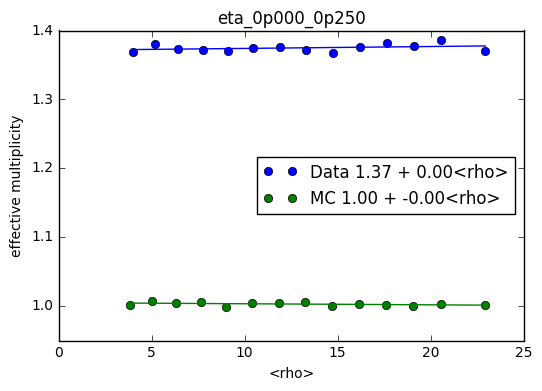

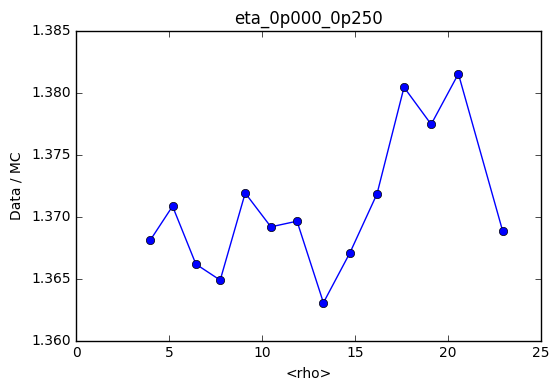

[output:1]

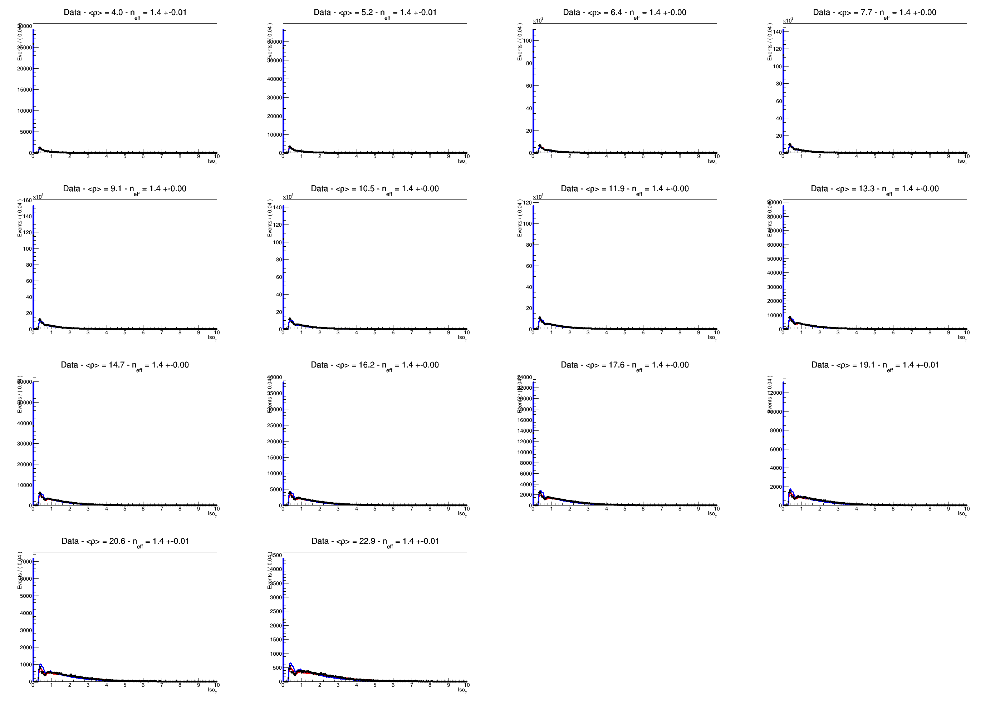

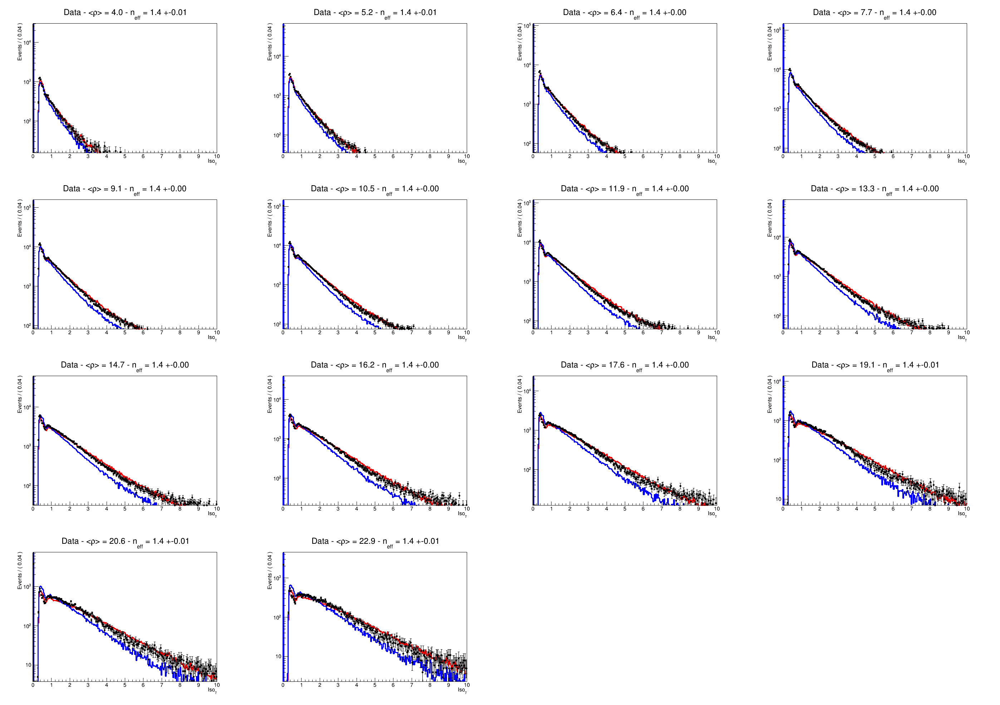

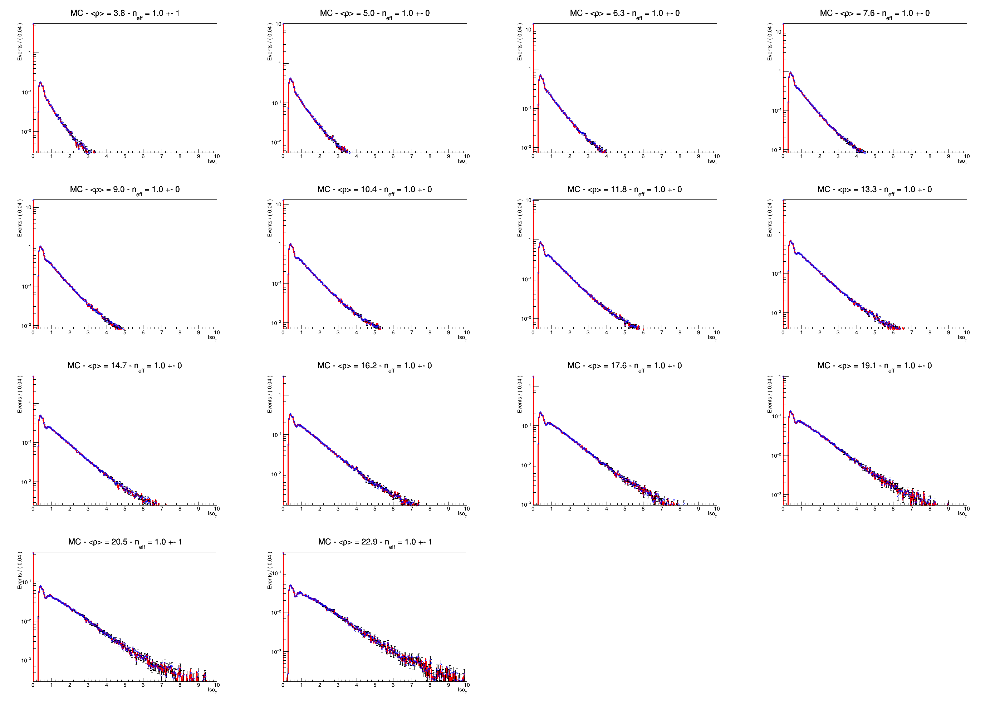

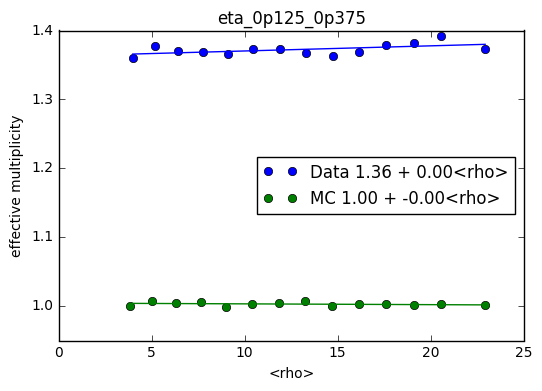

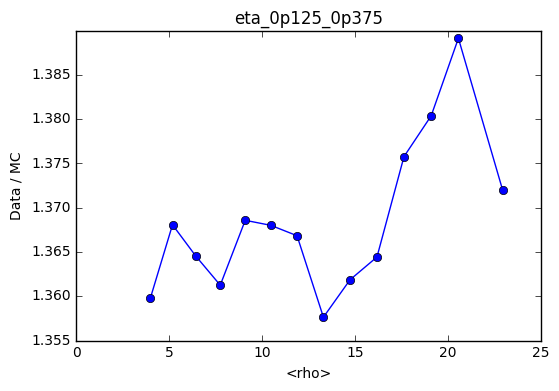

[output:2]

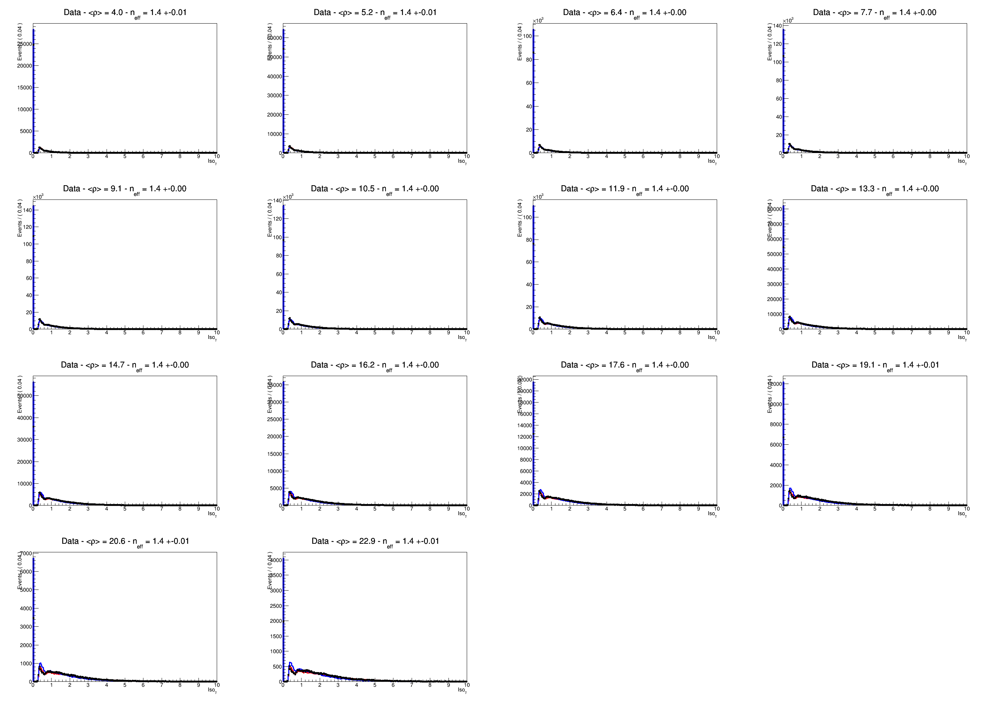

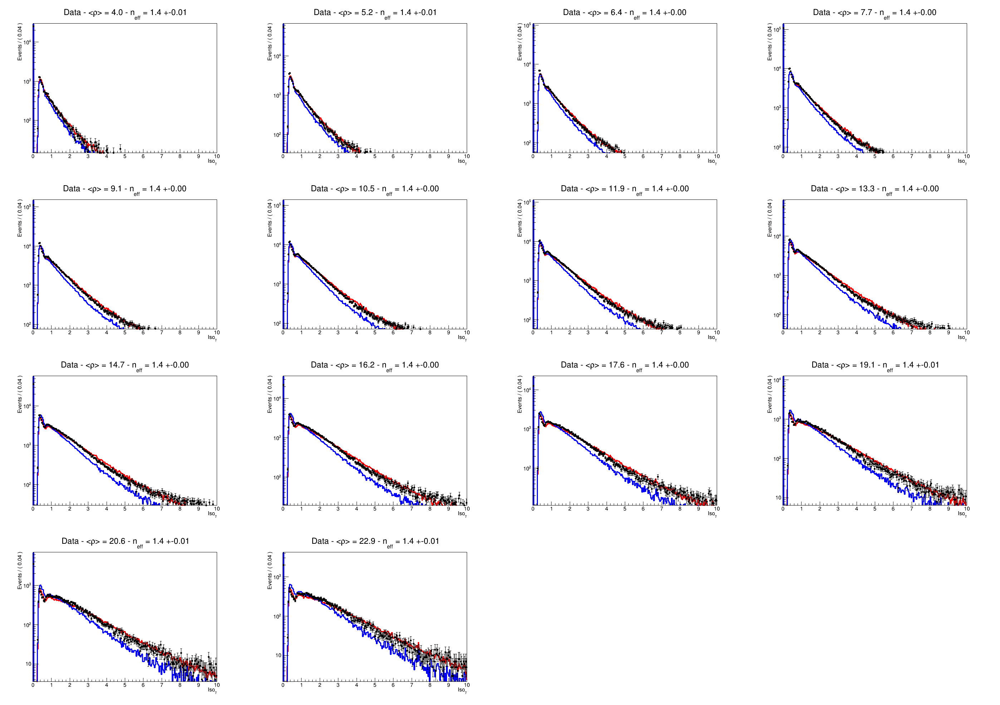

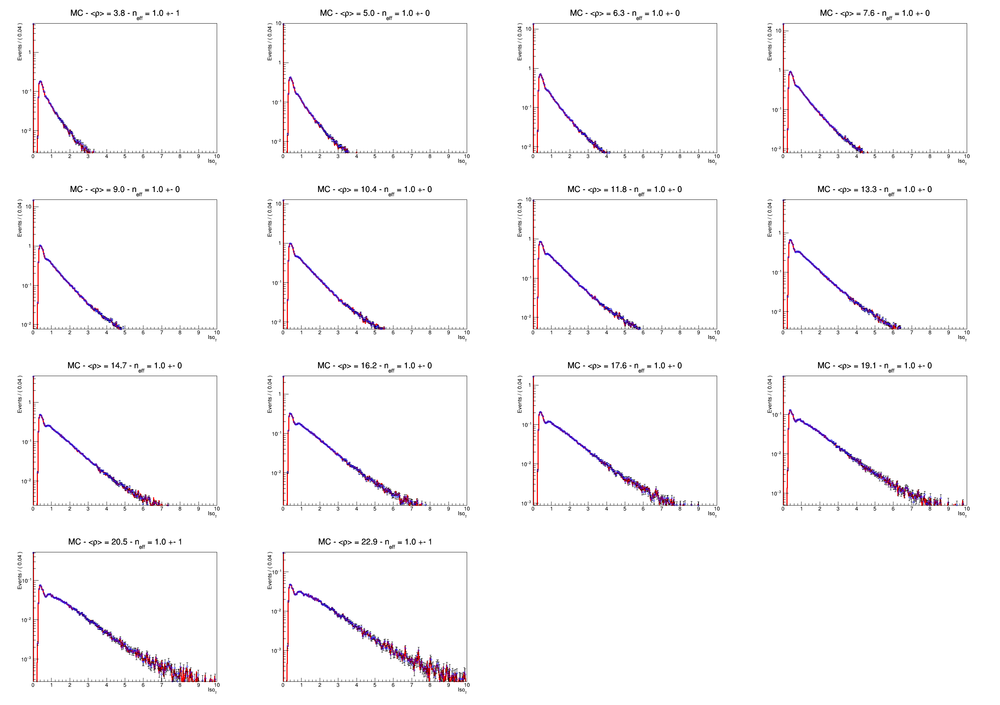

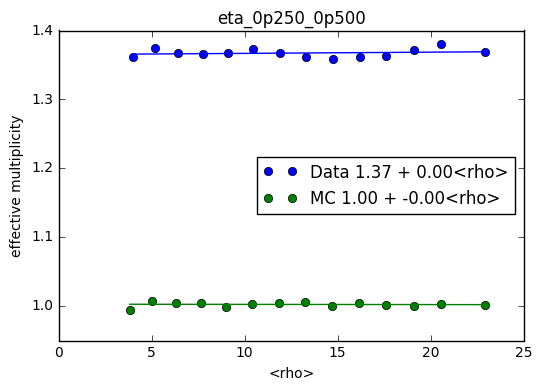

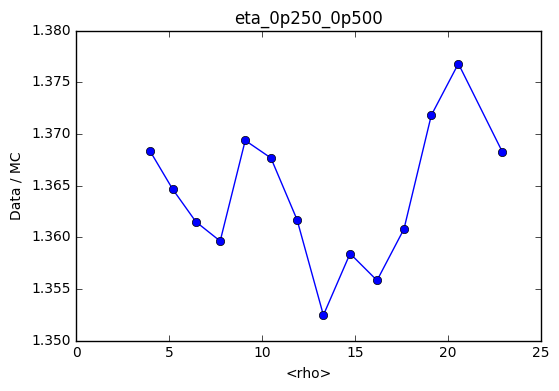

[output:3]

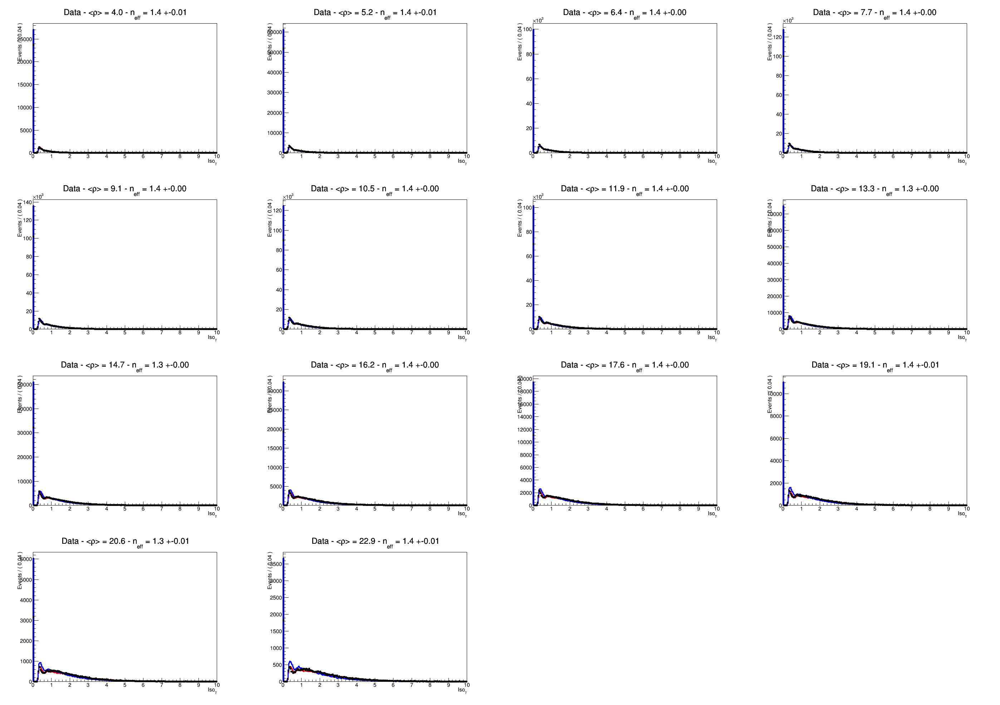

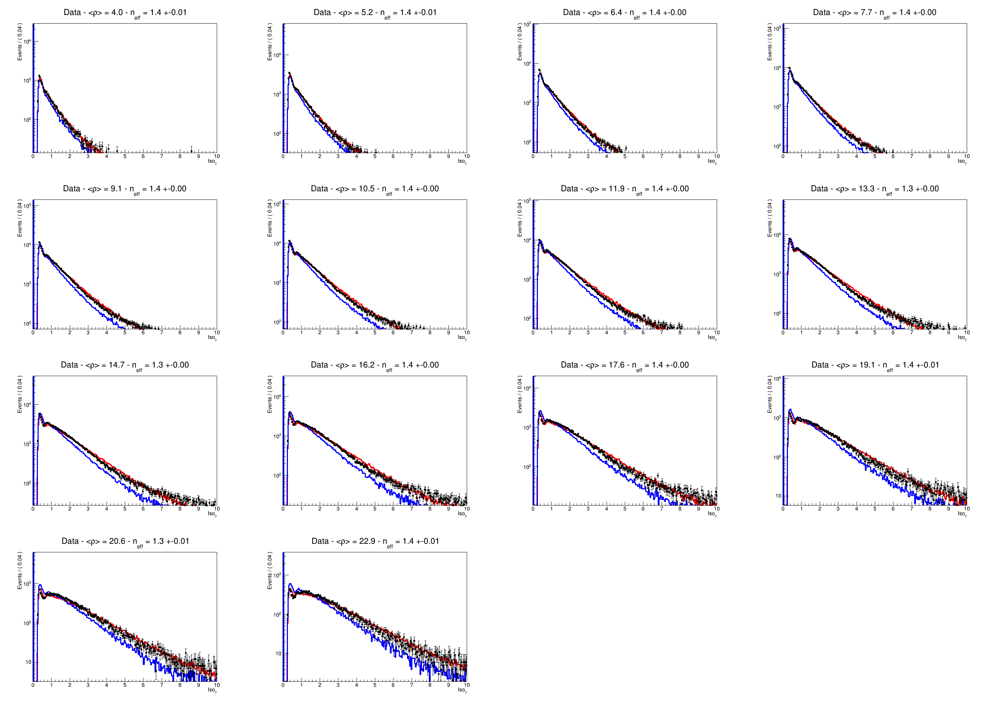

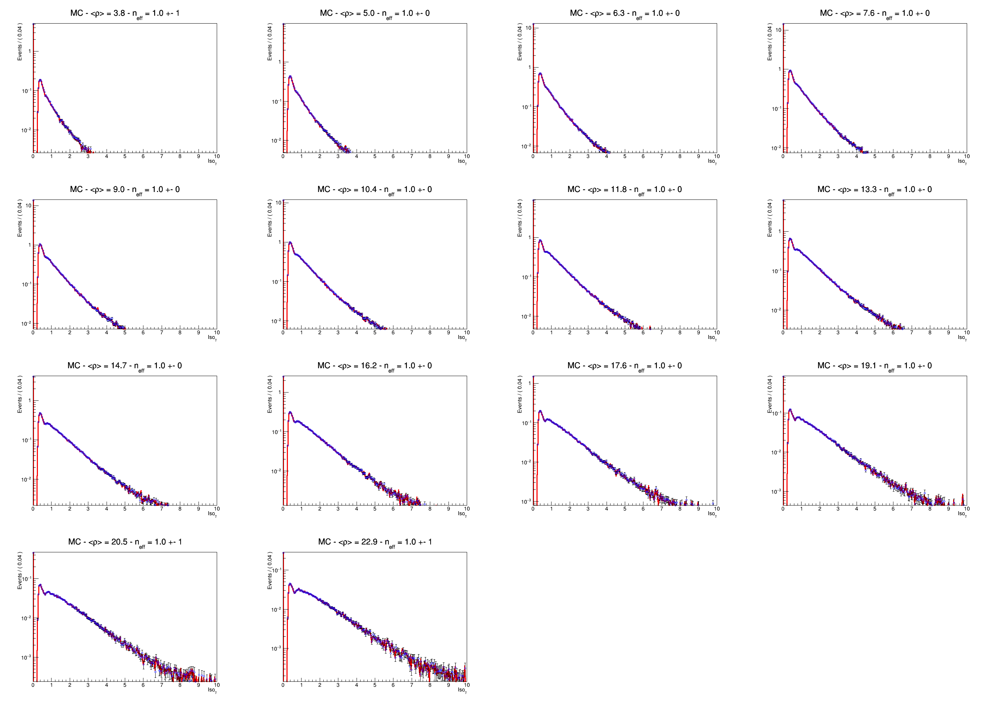

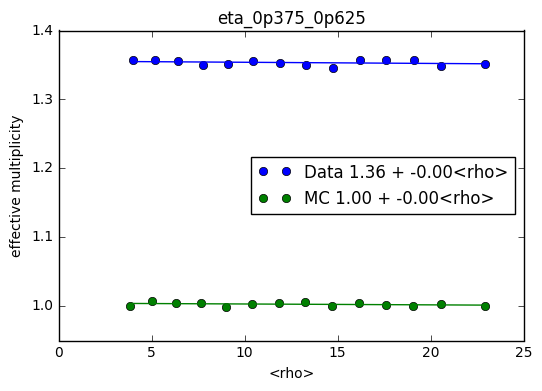

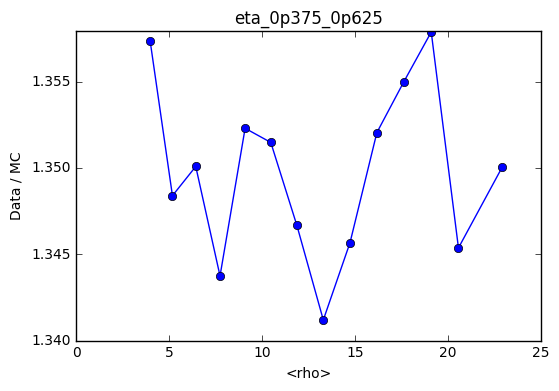

[output:4]

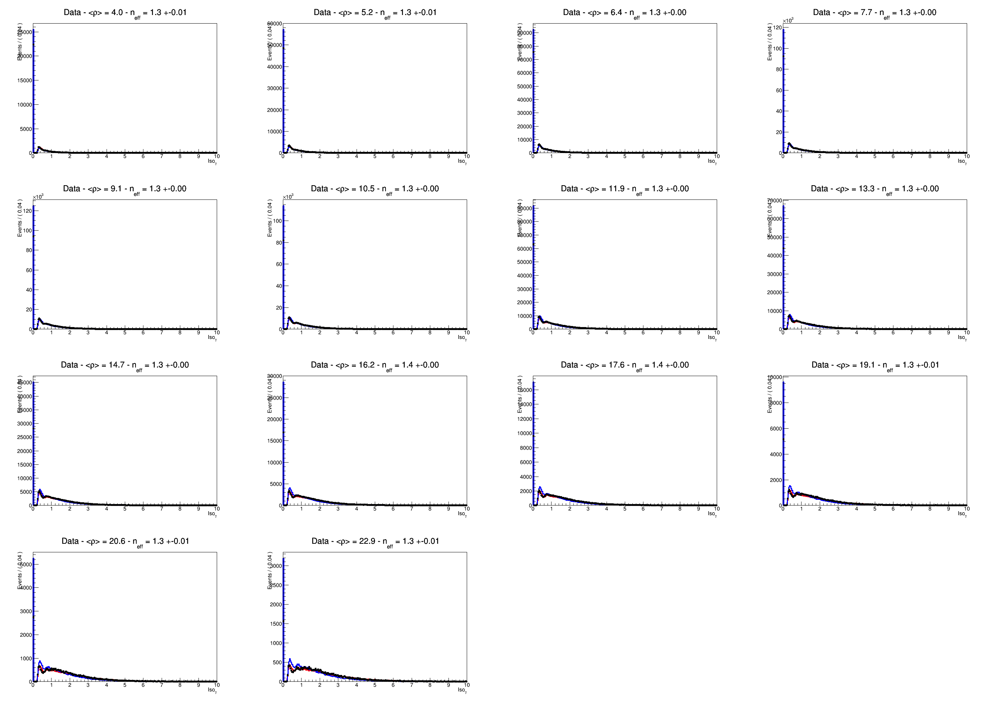

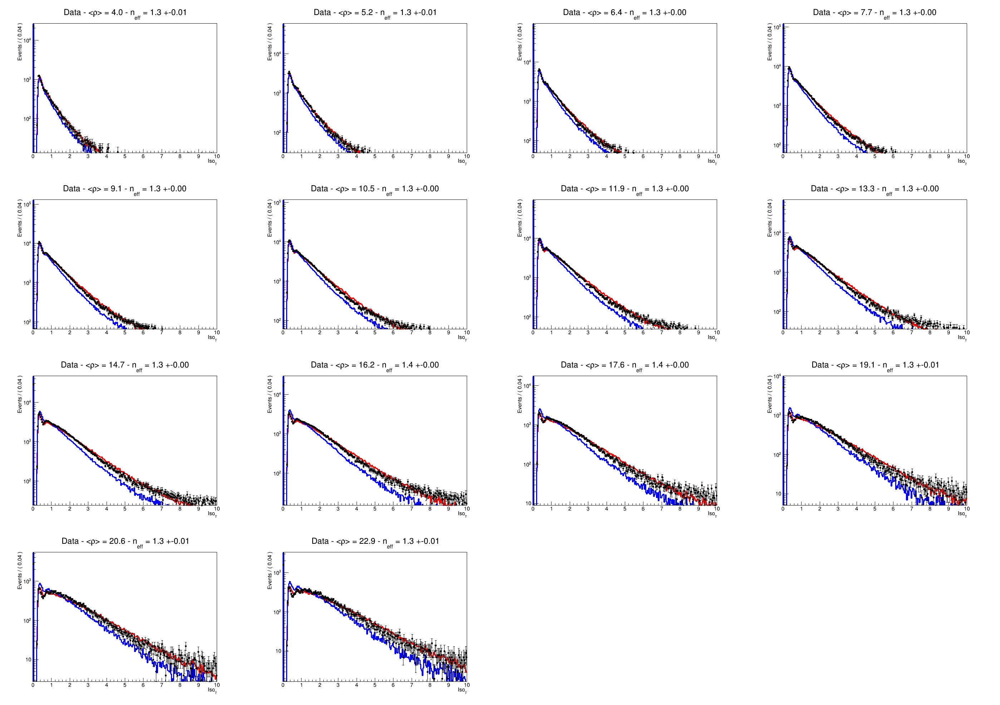

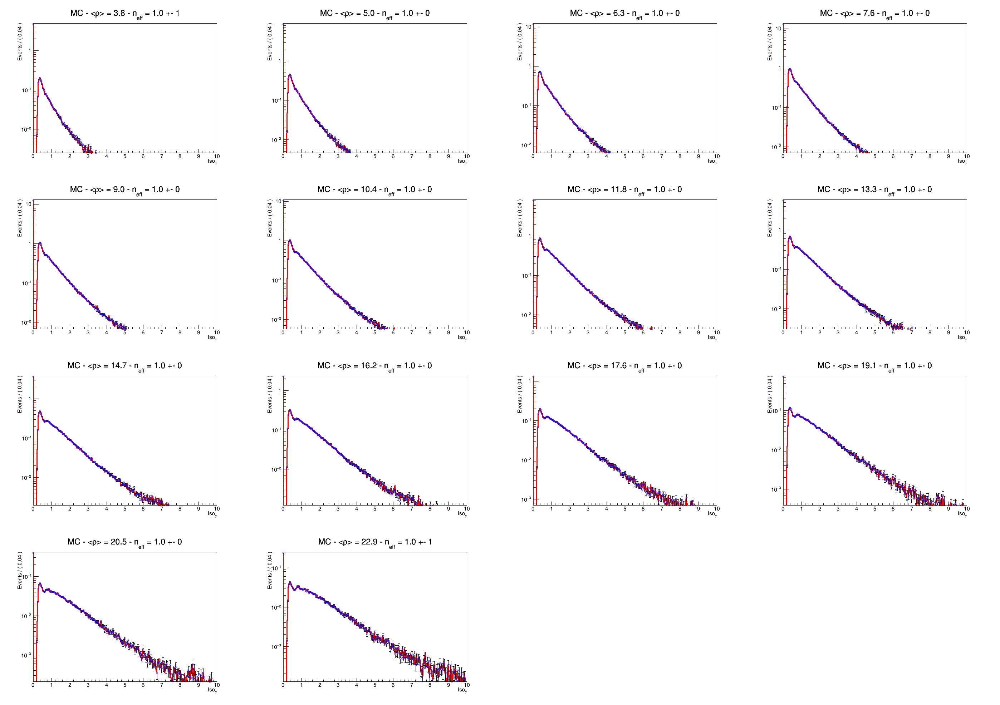

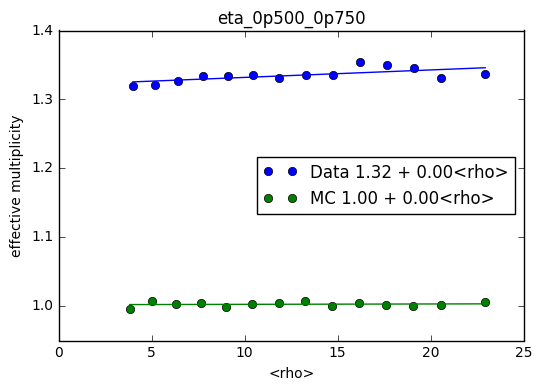

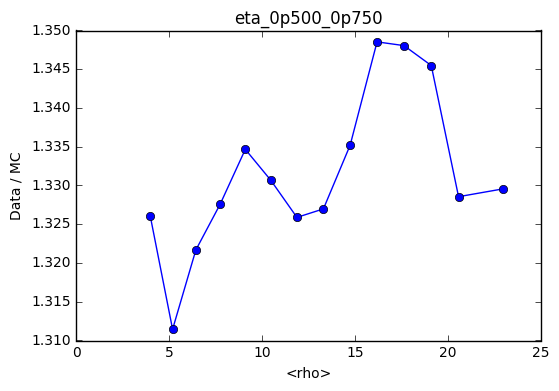

[output:5]

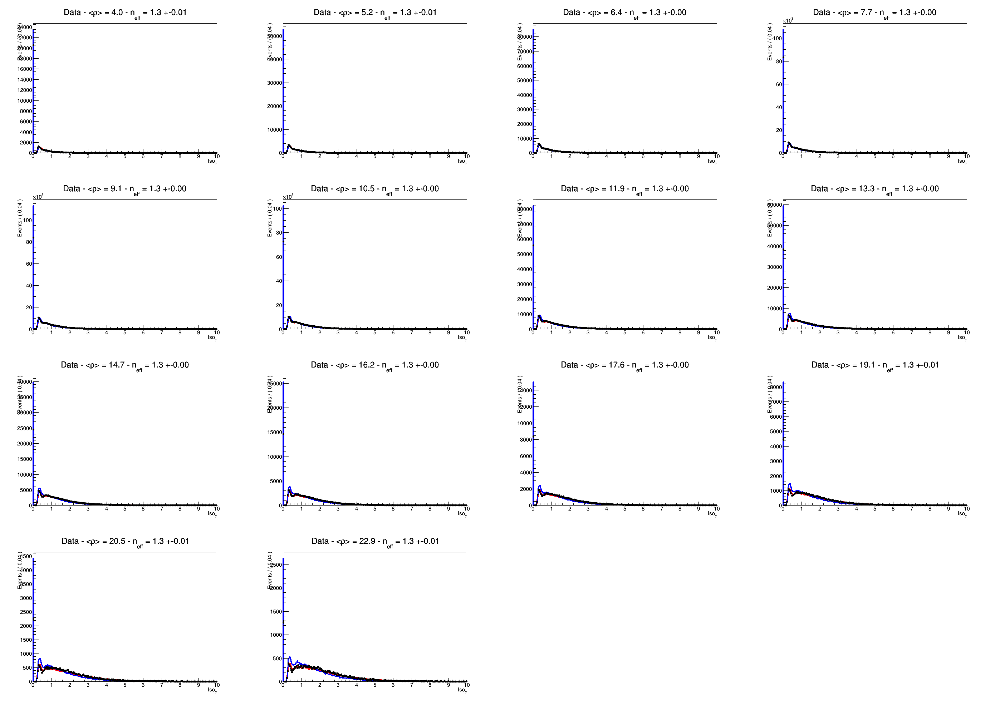

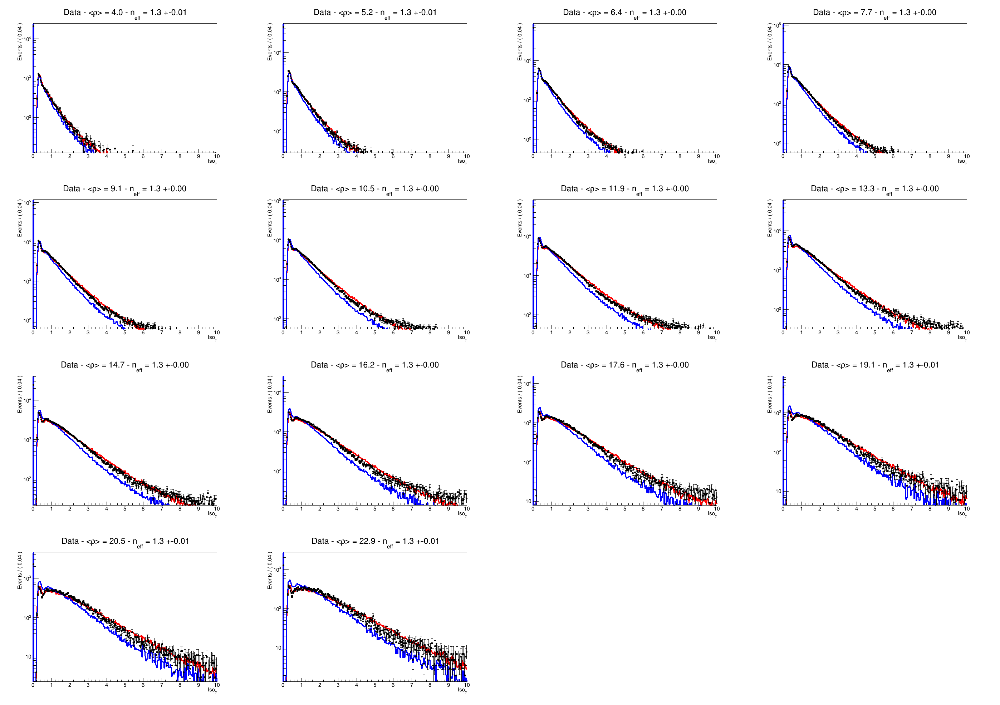

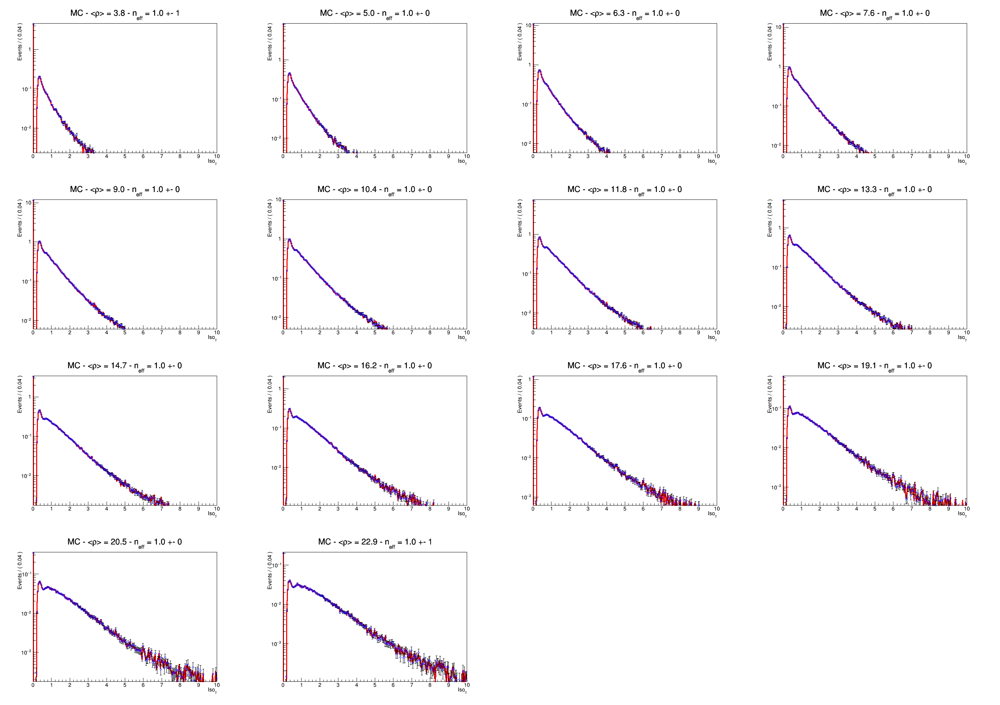

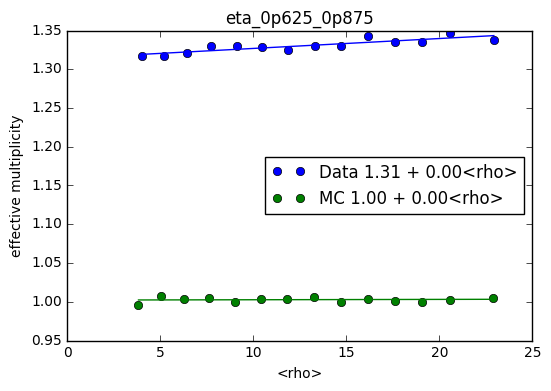

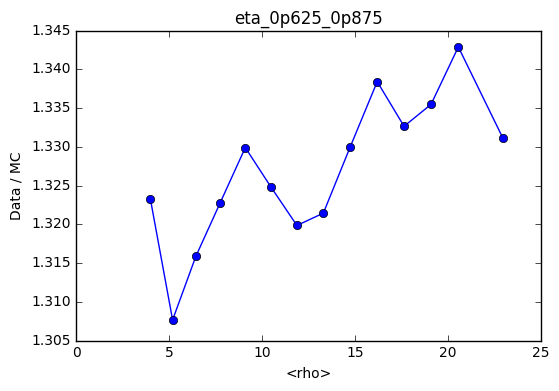

[output:6]

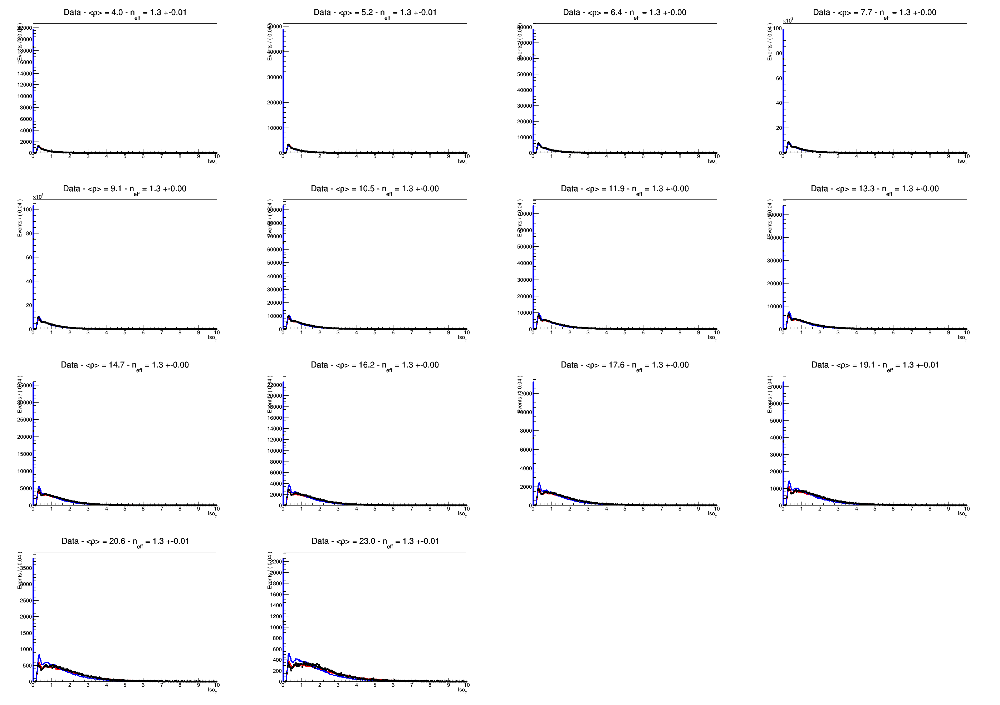

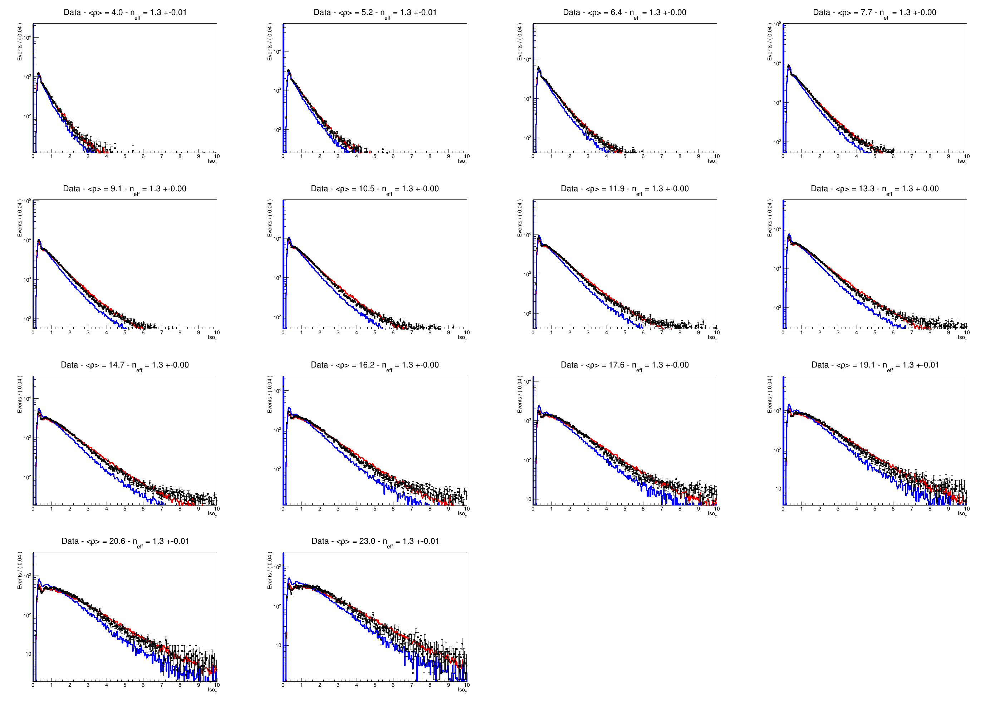

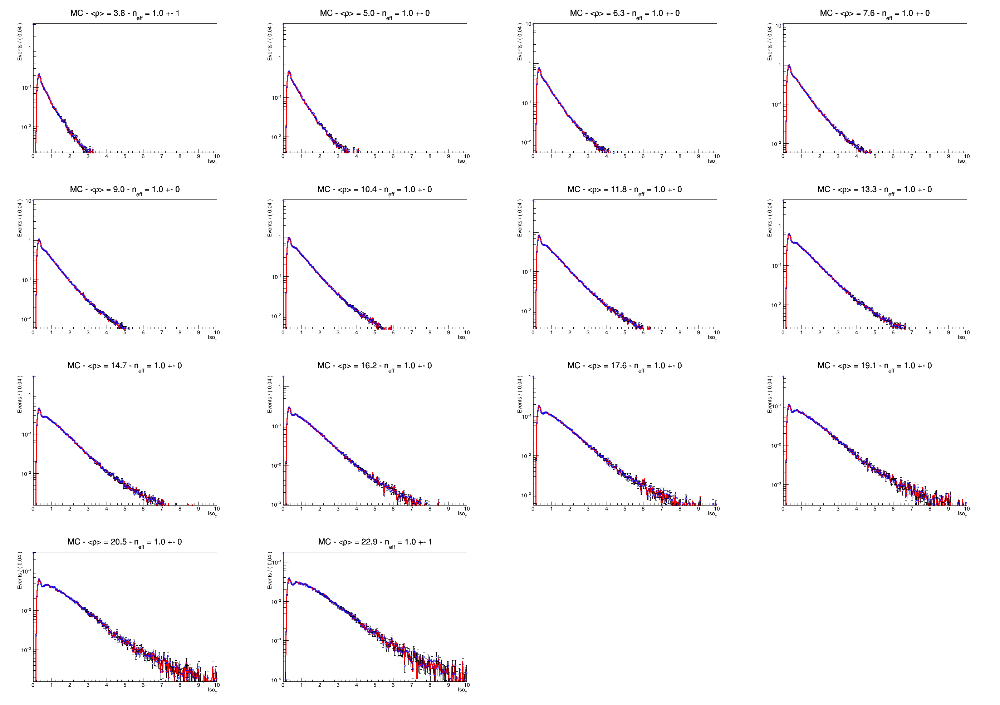

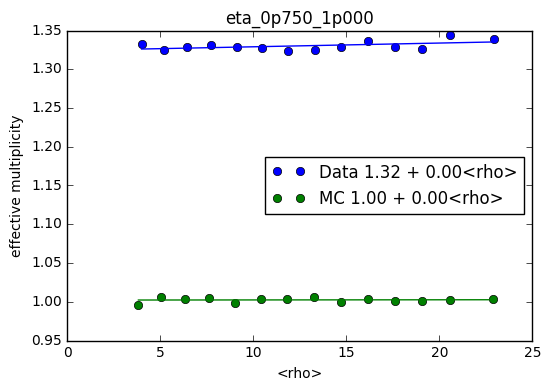

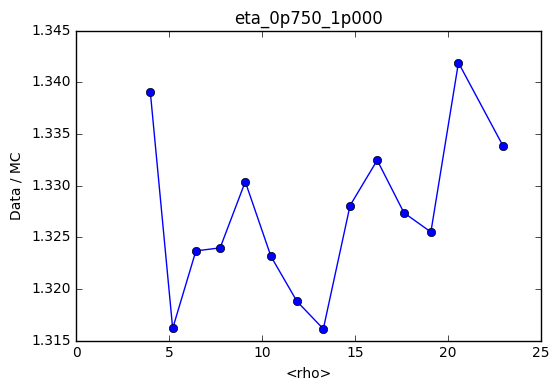

[output:7]

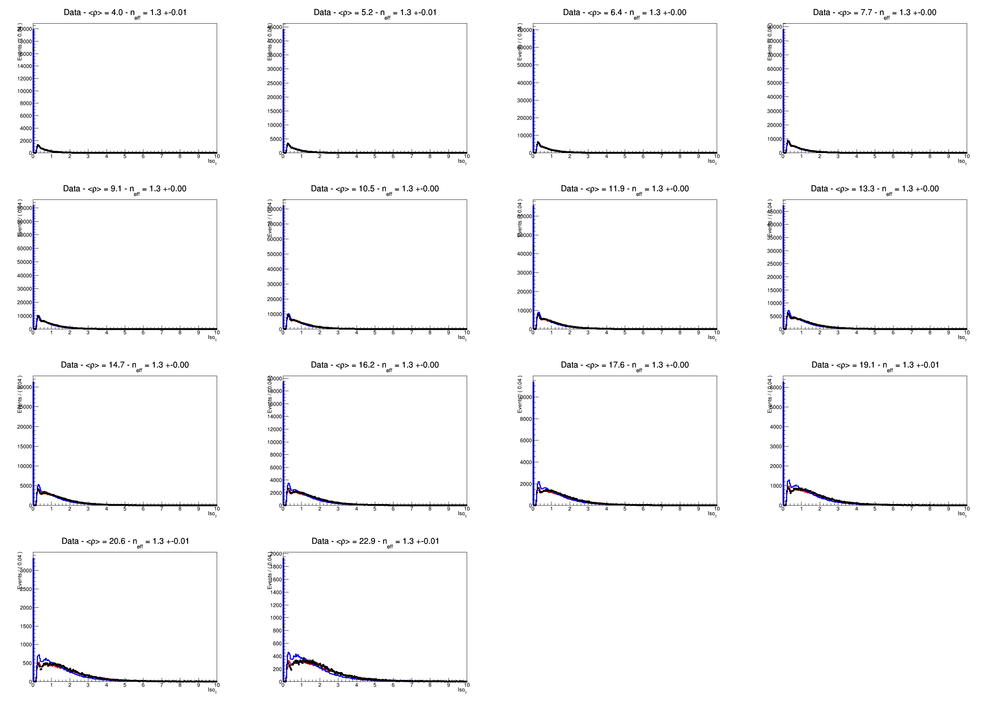

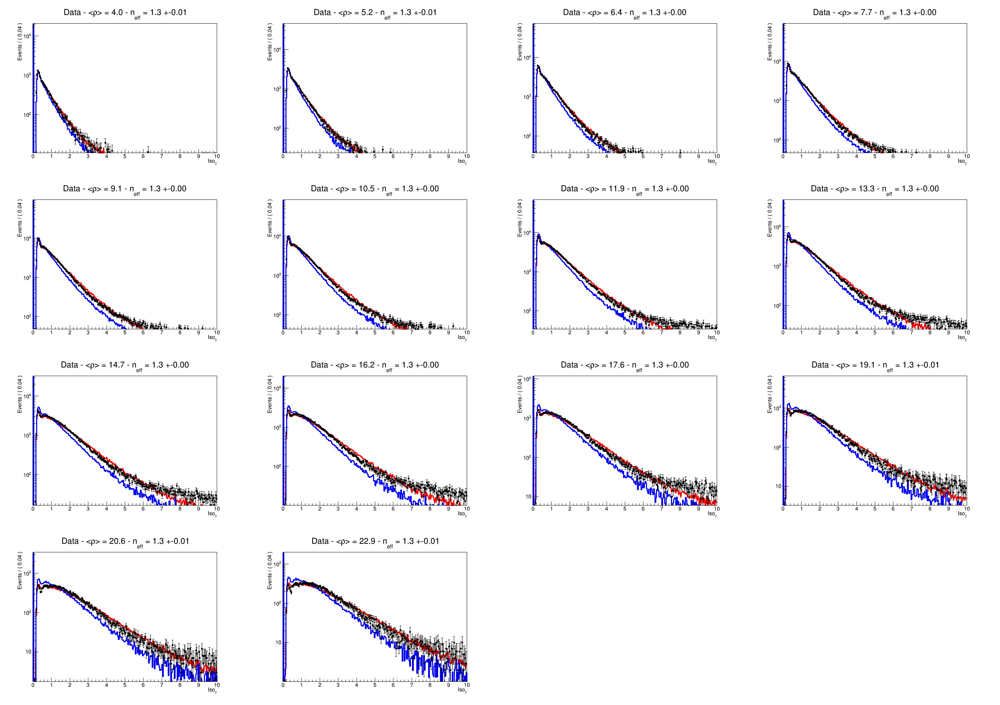

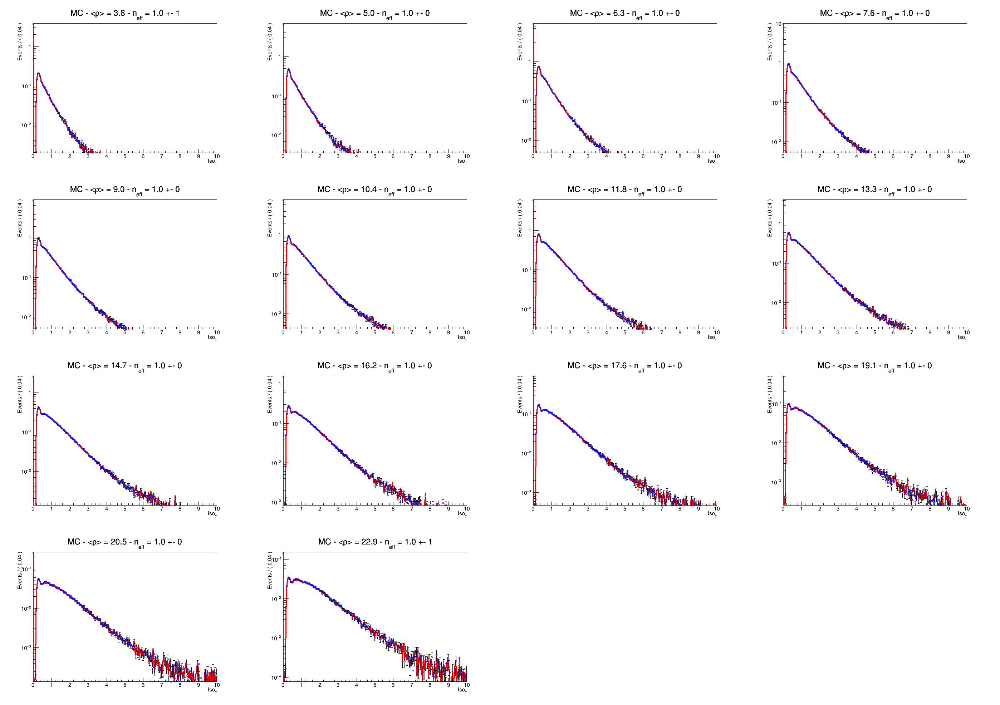

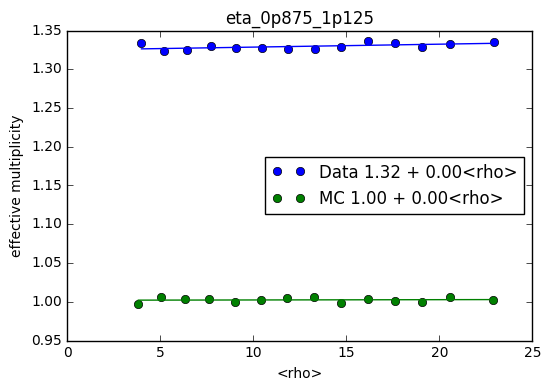

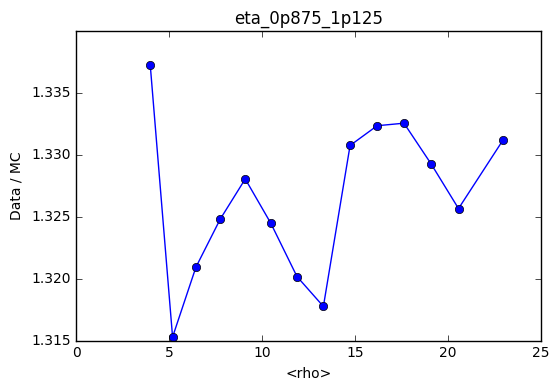

[output:8]

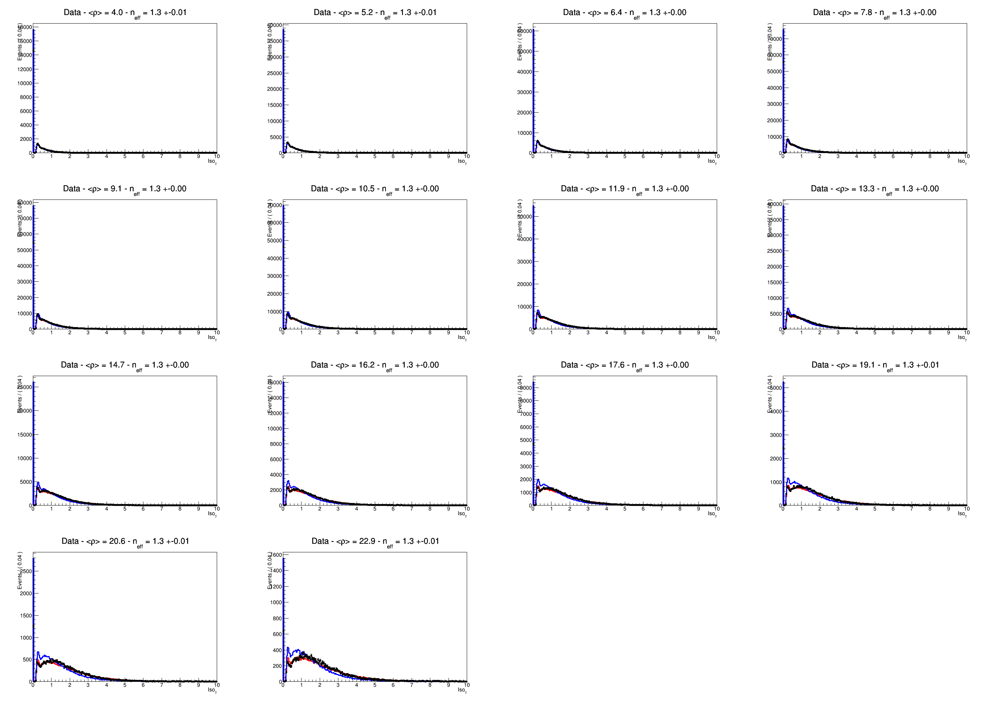

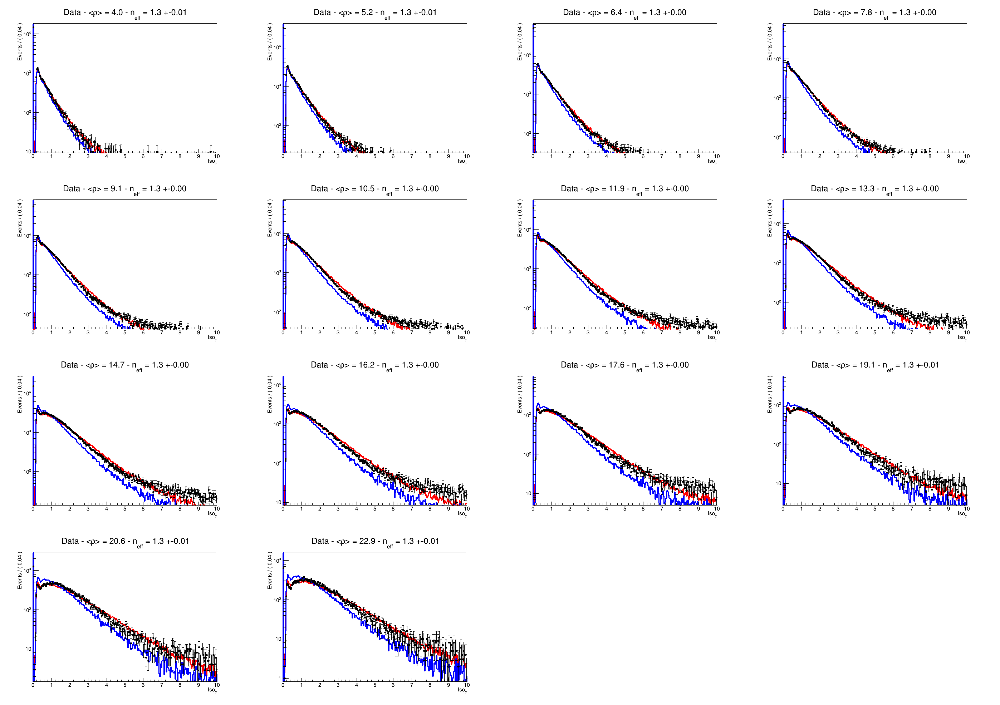

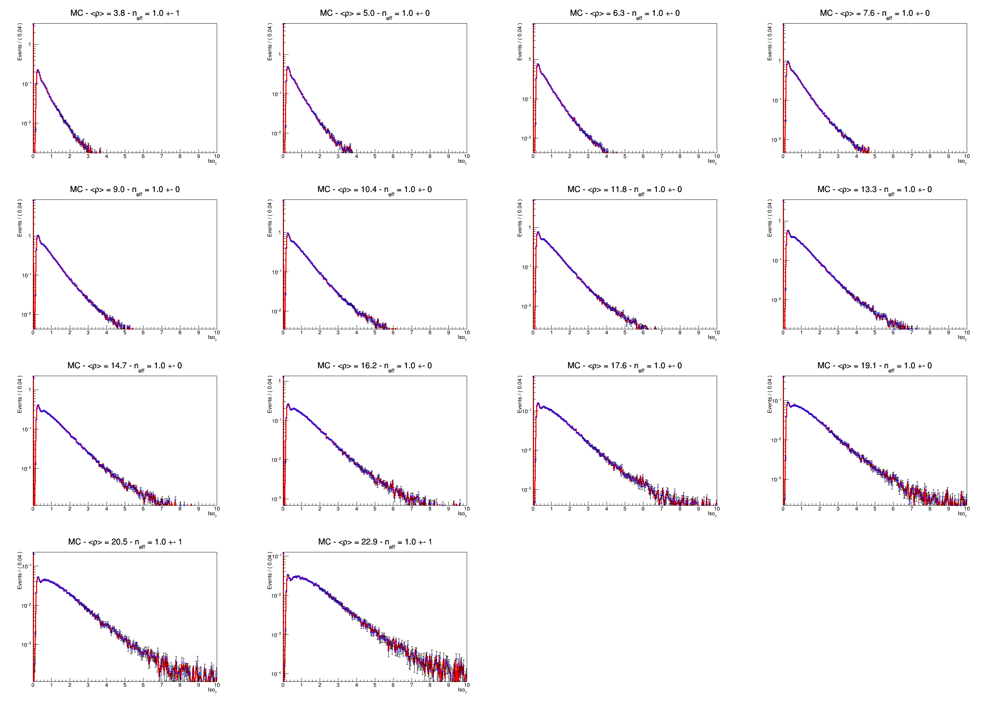

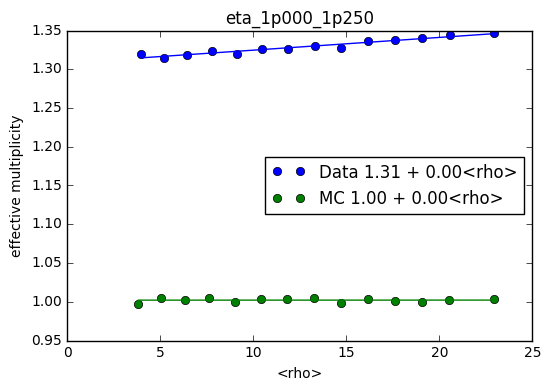

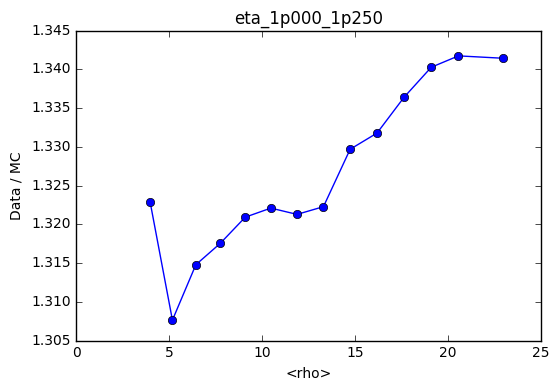

[output:9]

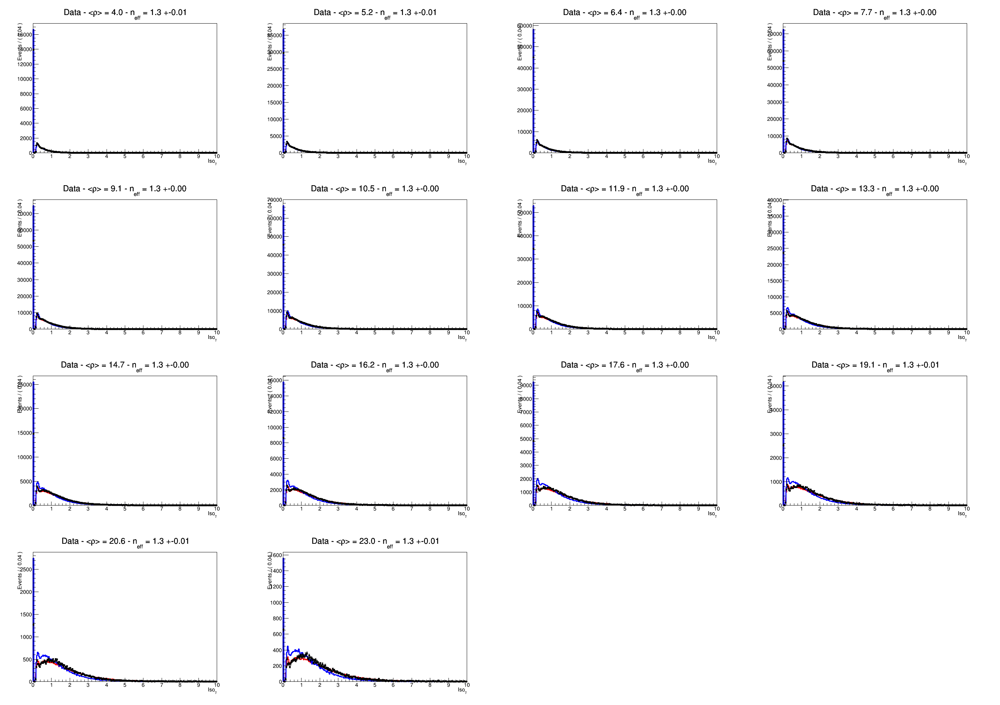

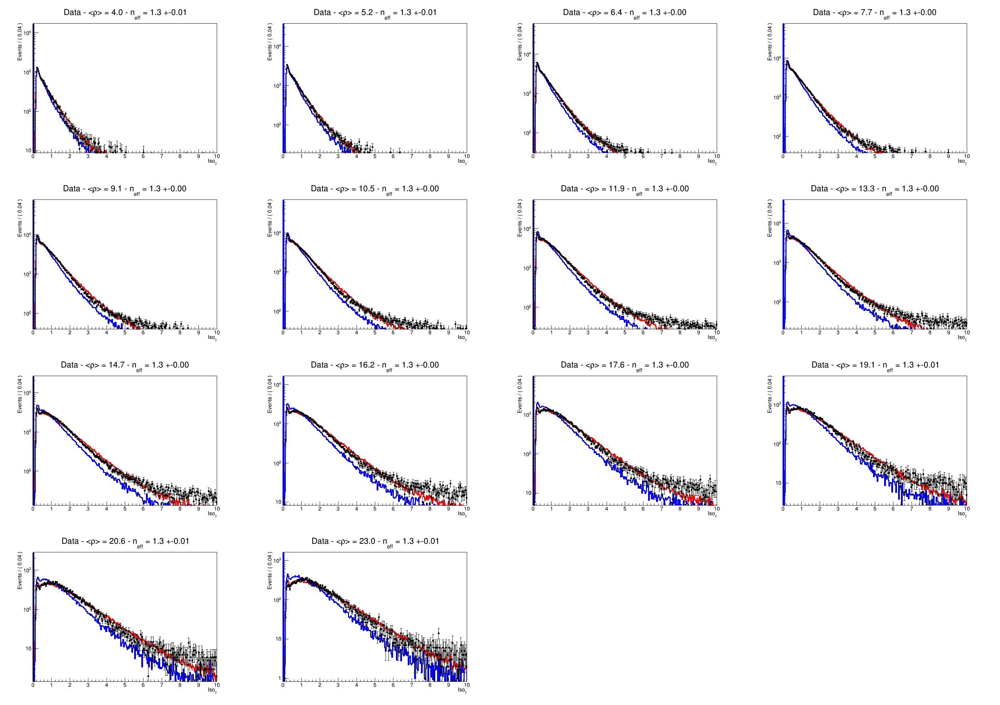

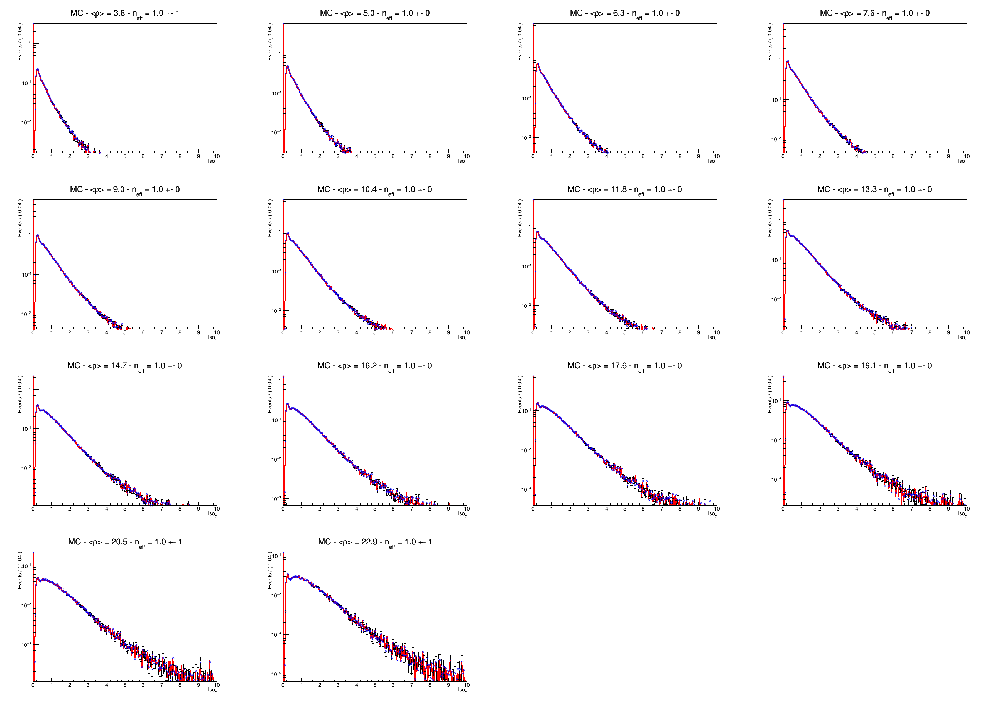

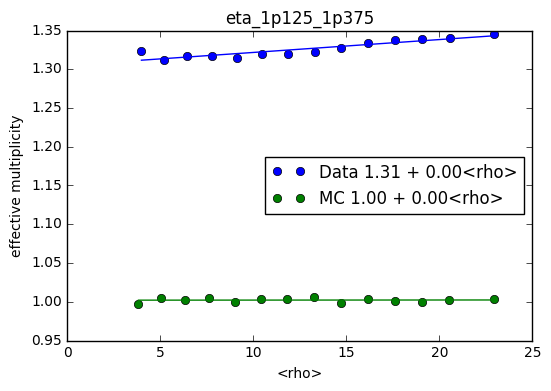

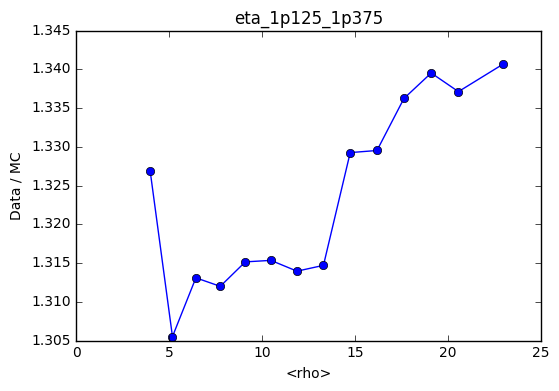

[output:10]

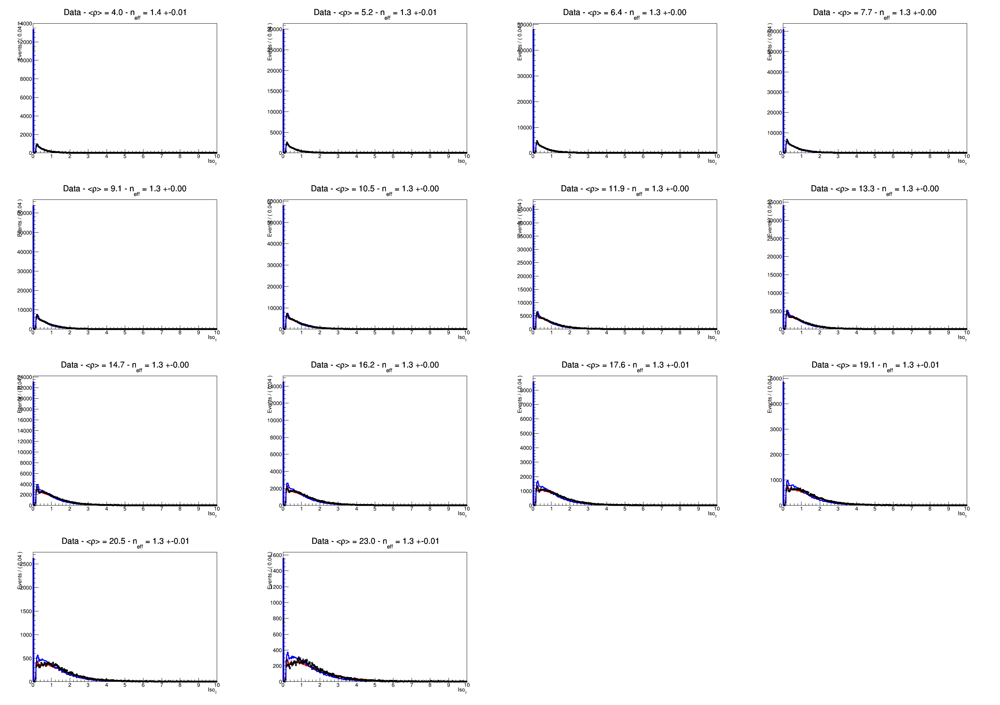

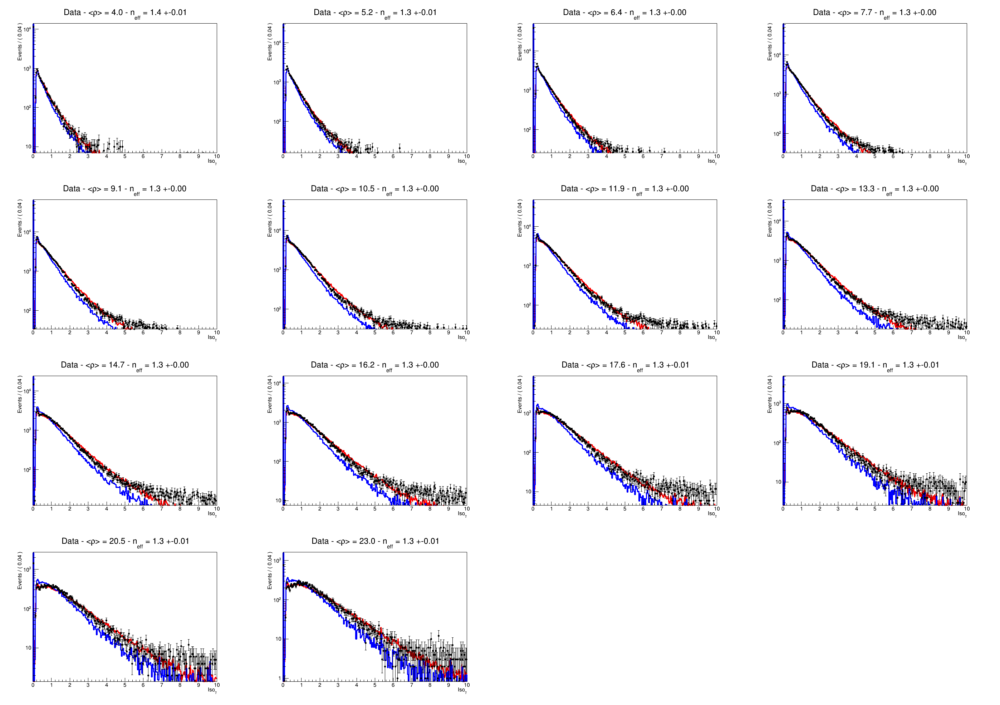

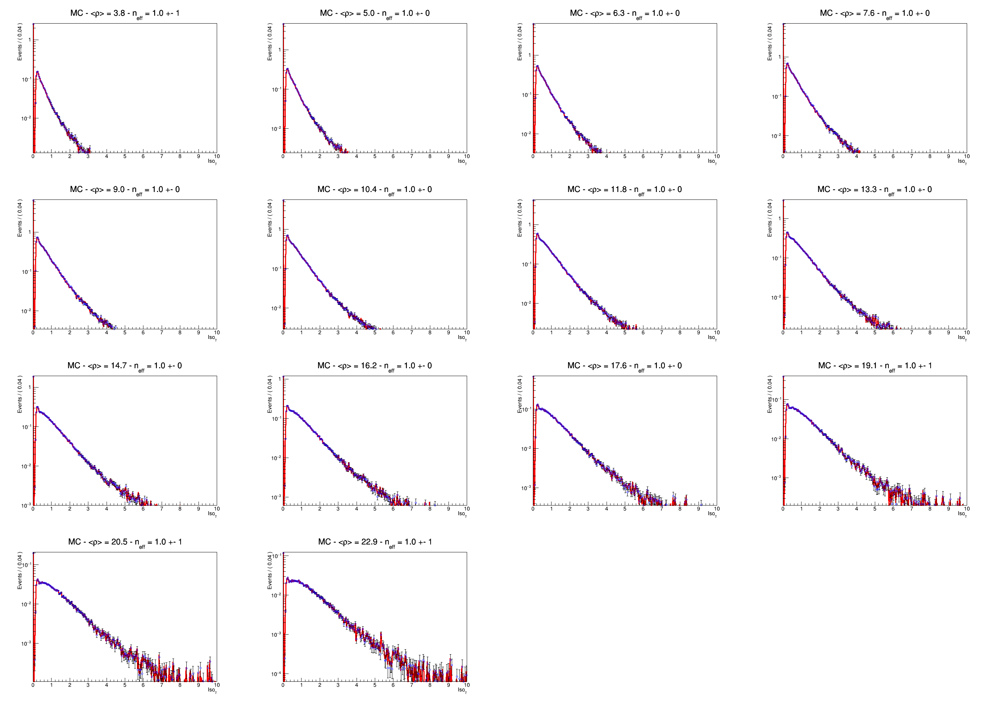

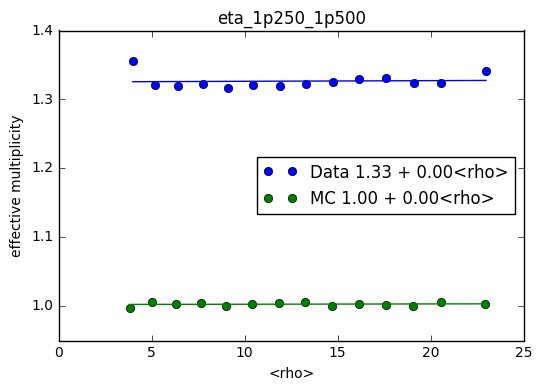

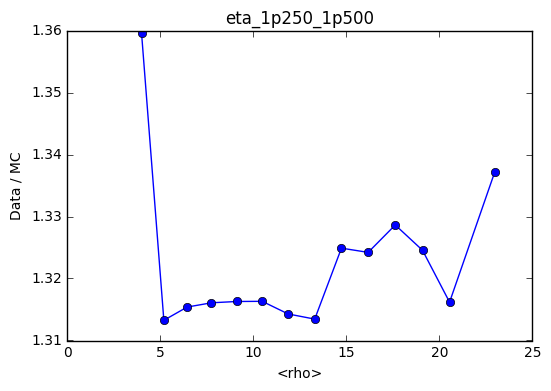

[output:11]

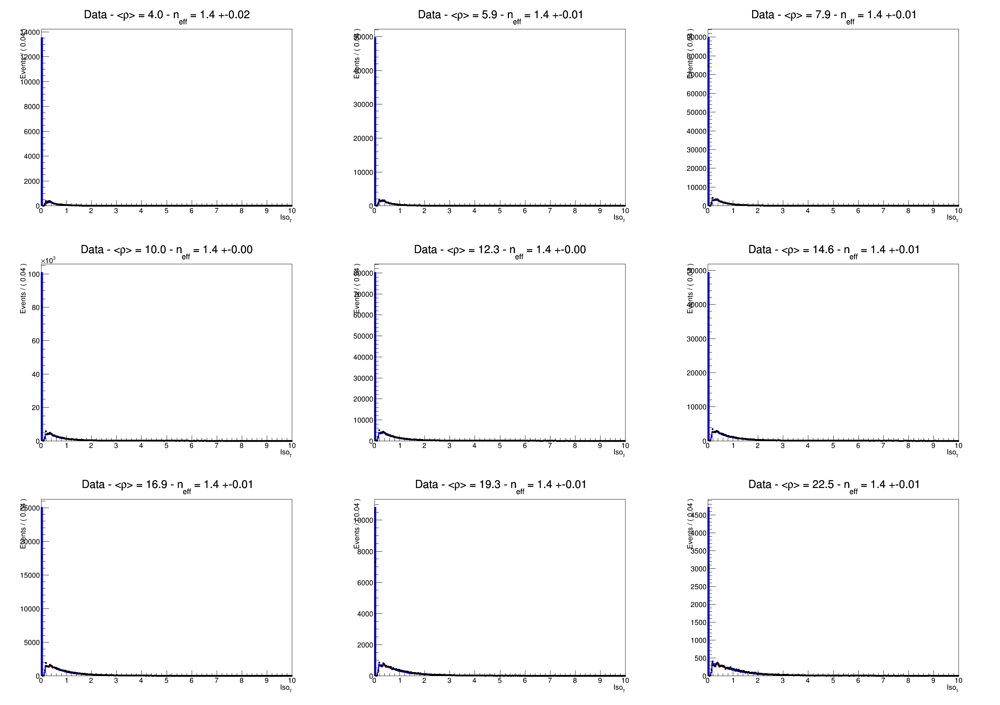

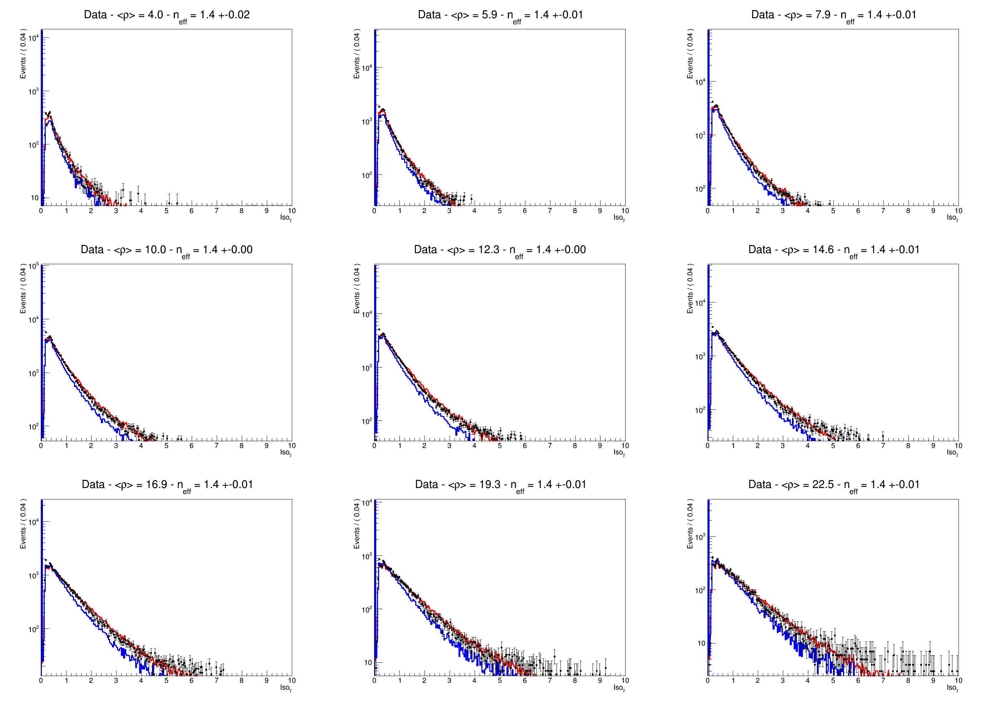

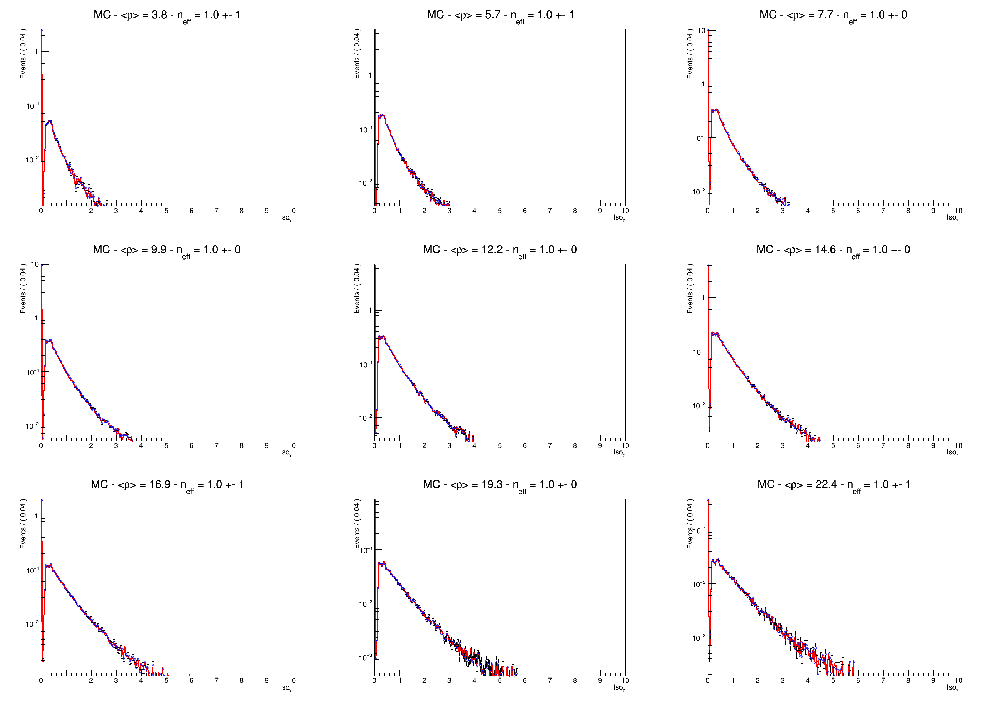

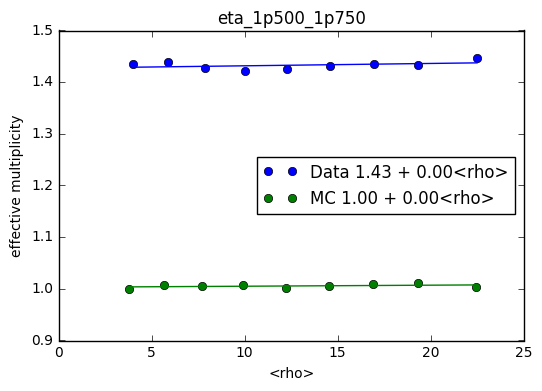

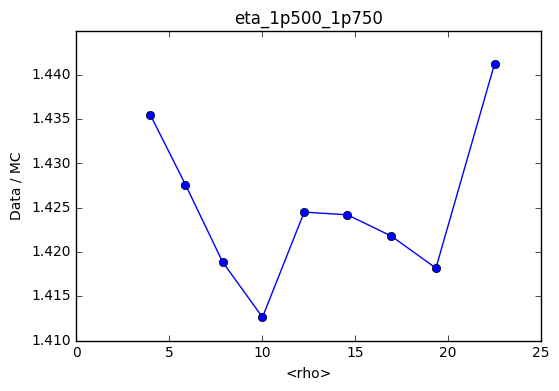

[output:12]

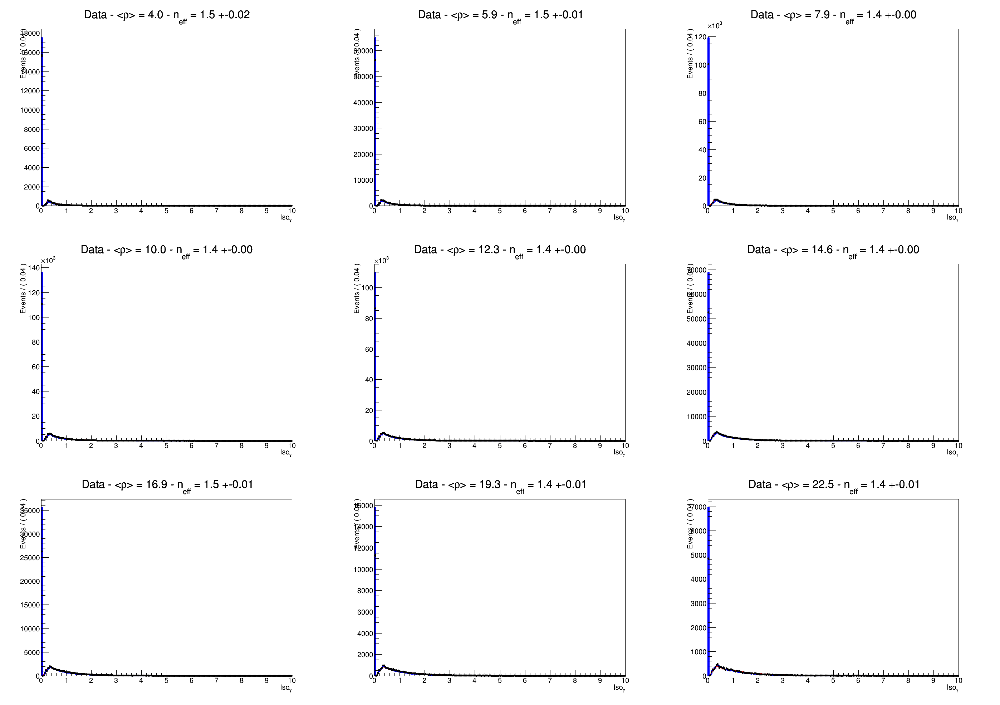

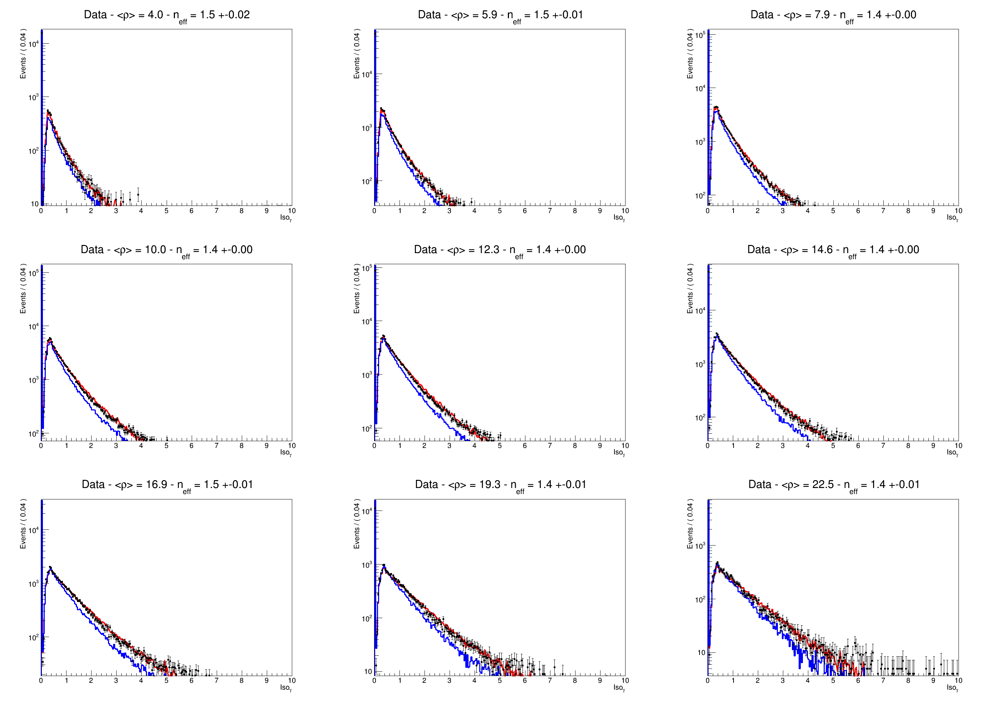

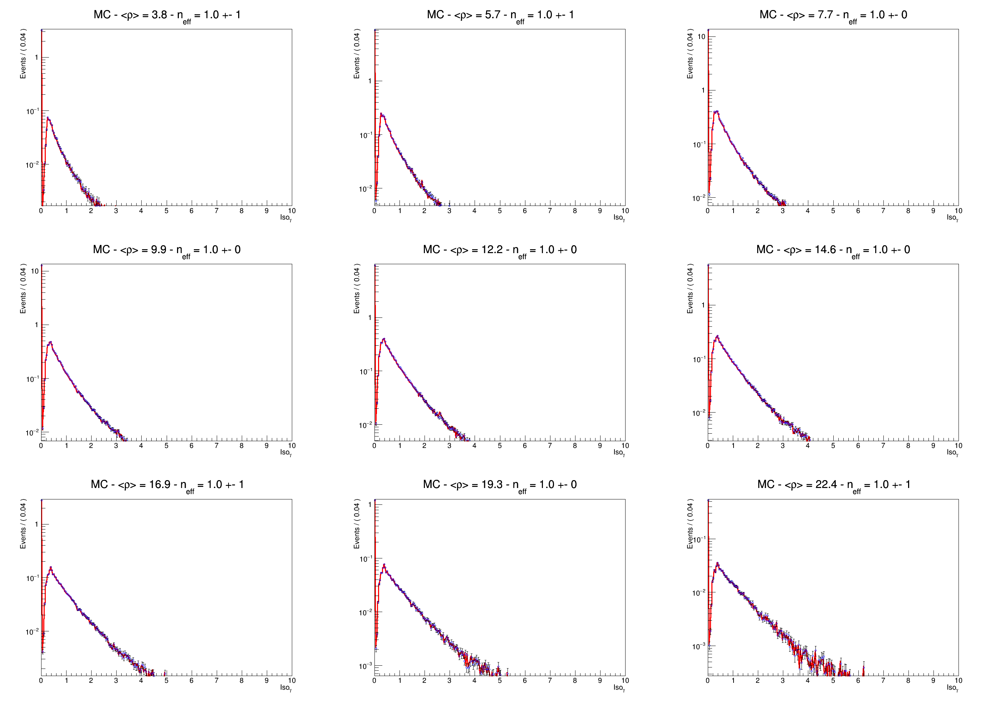

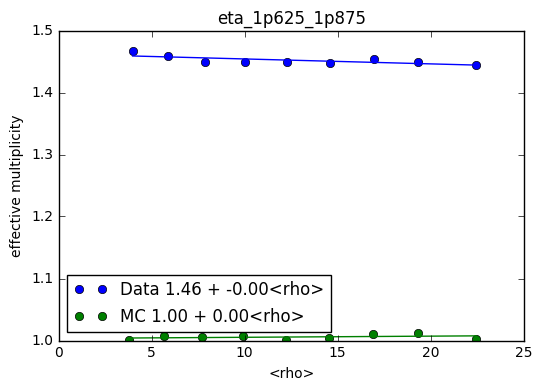

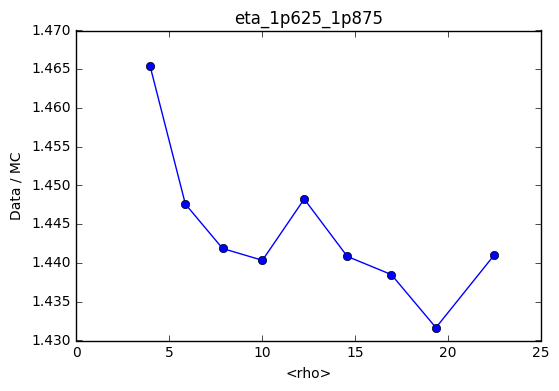

[output:13]

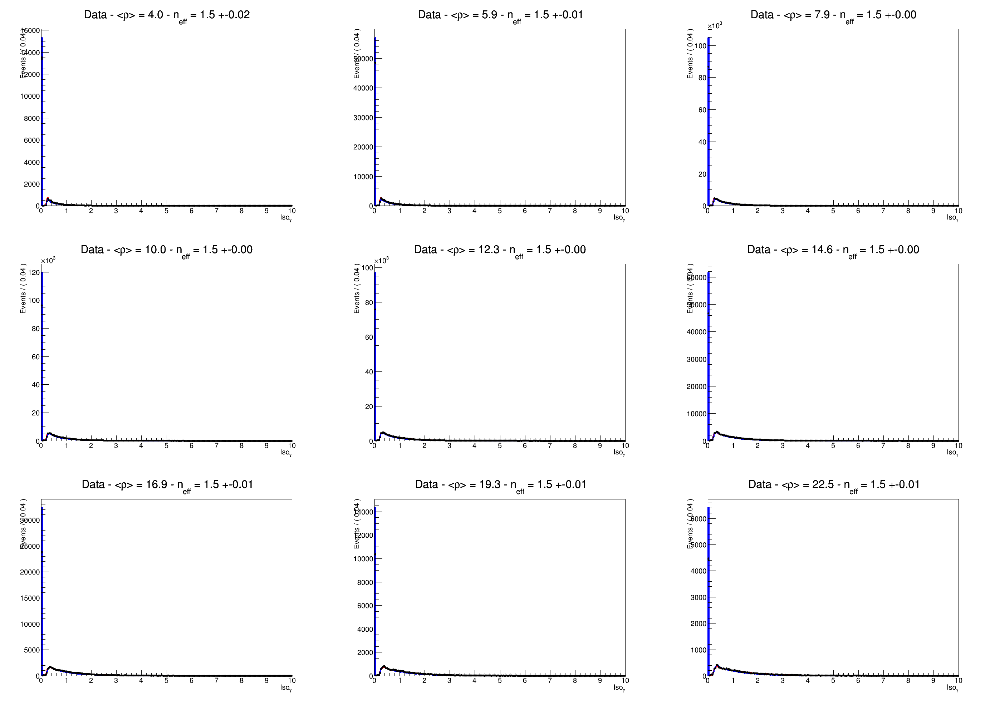

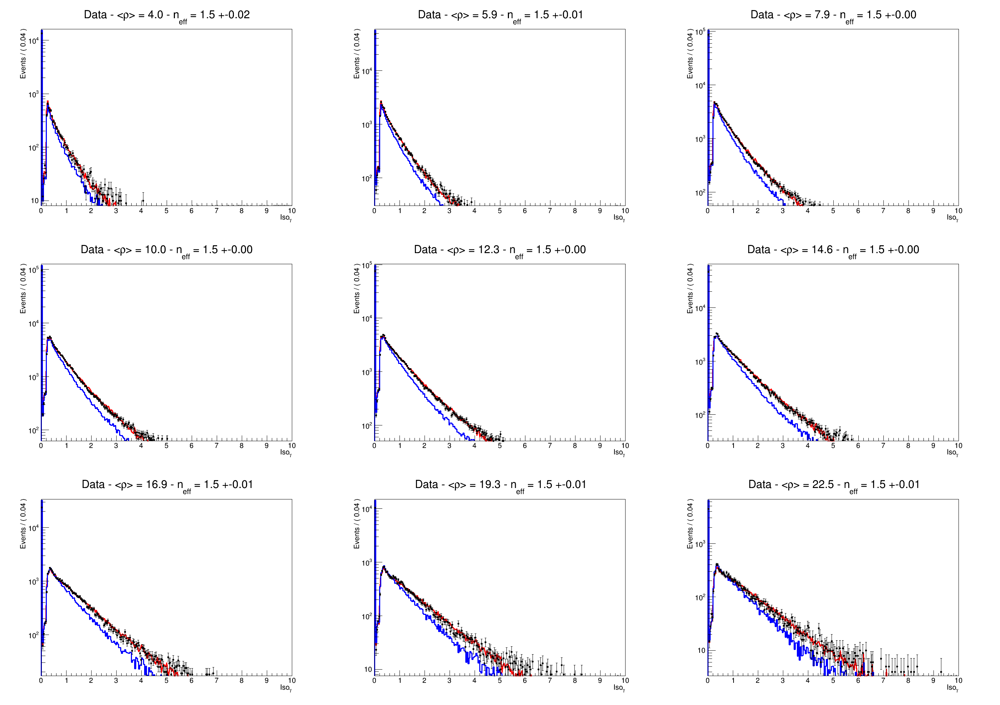

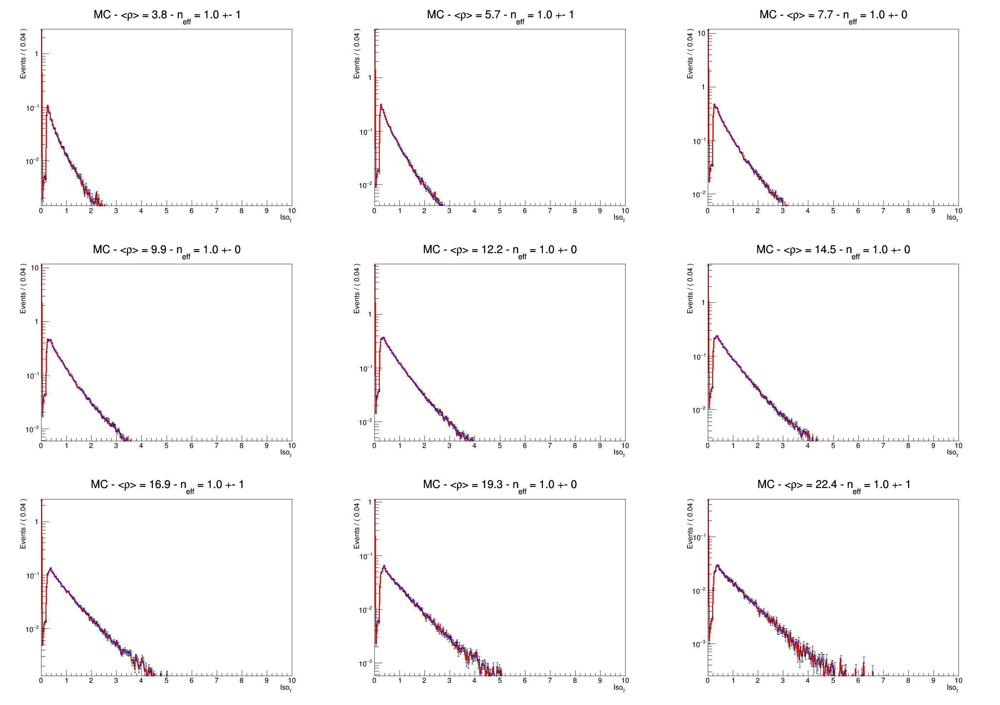

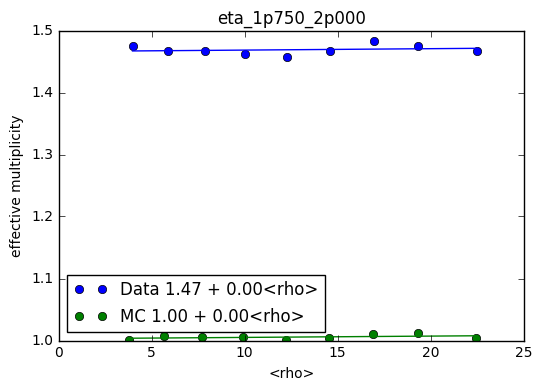

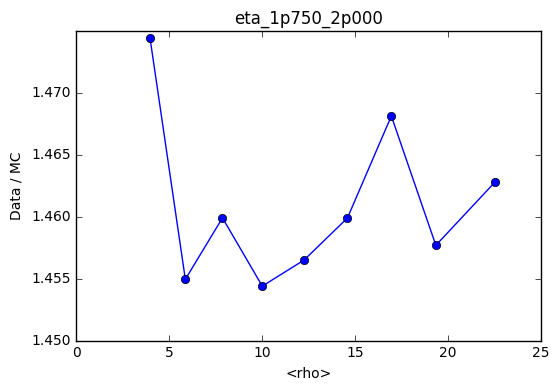

[output:14]

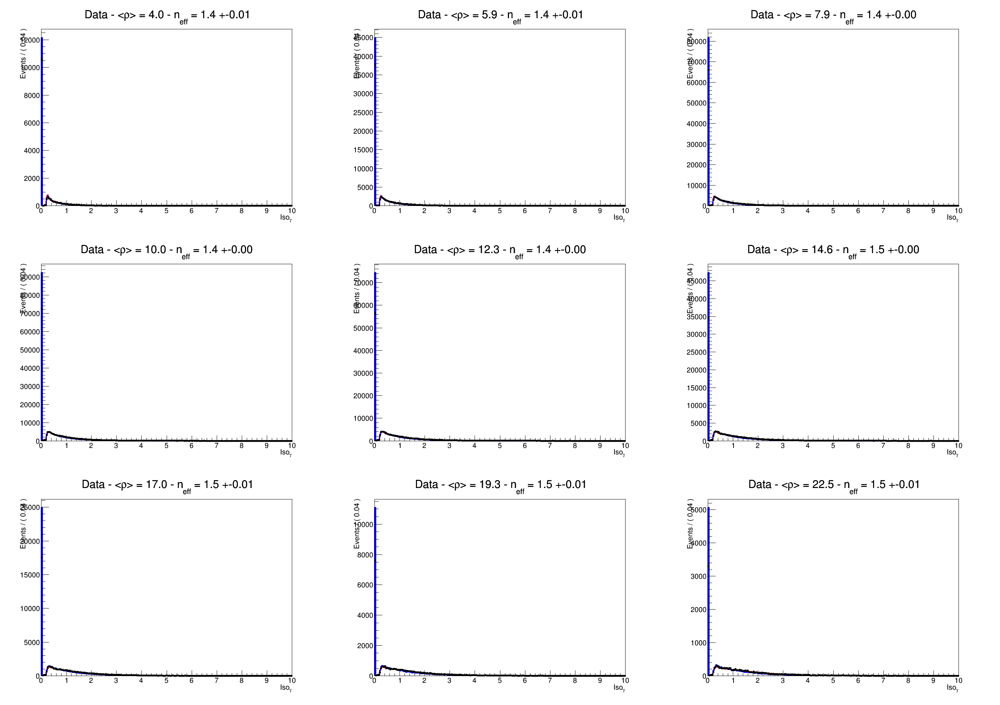

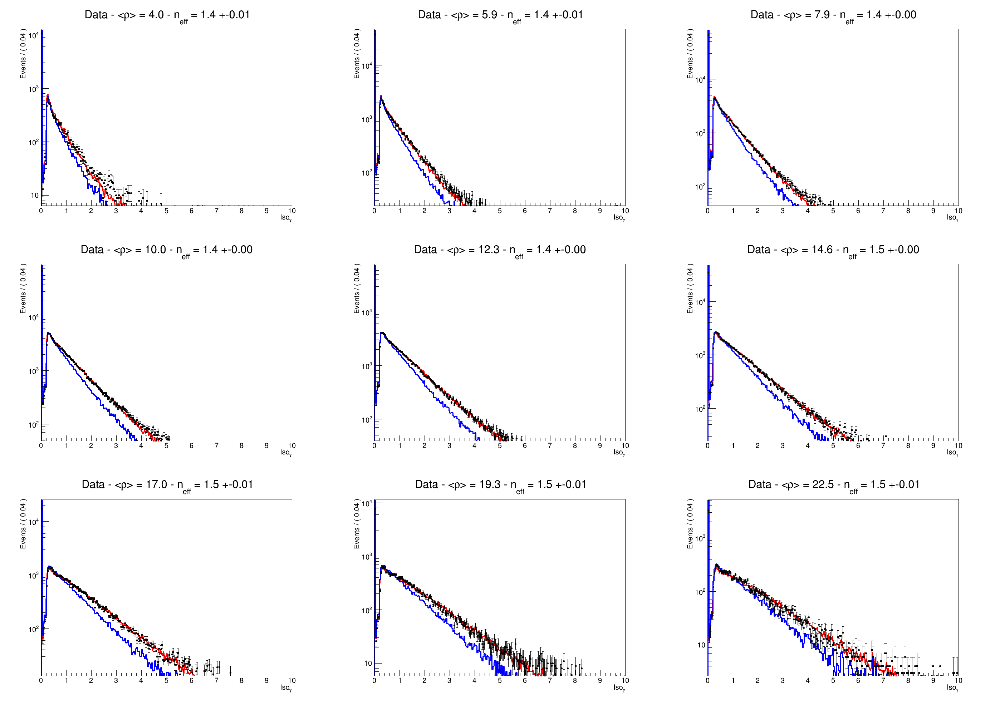

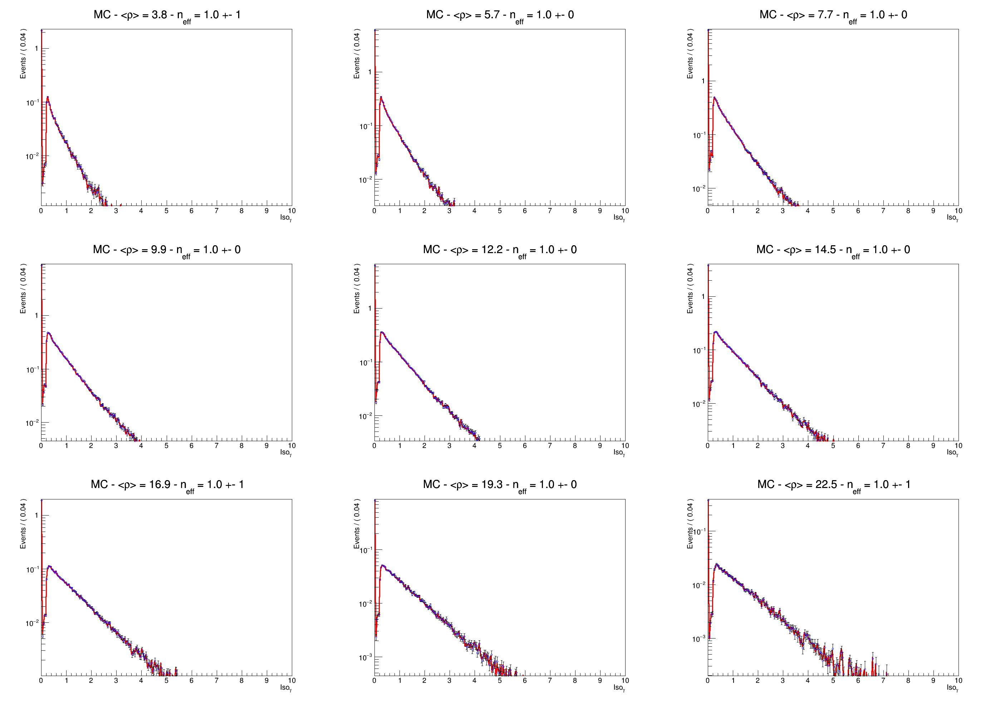

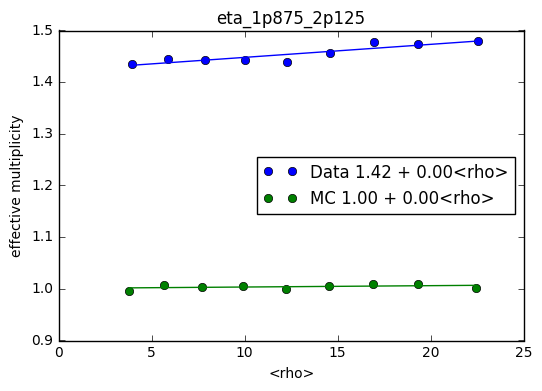

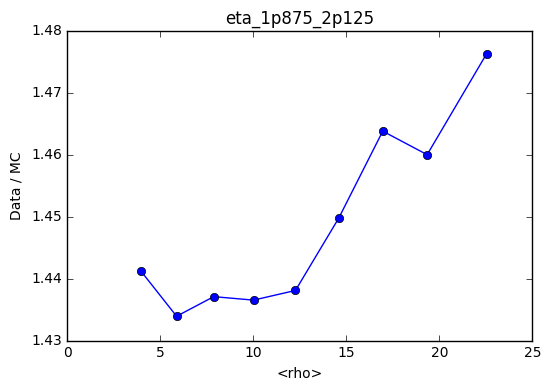

[output:15]

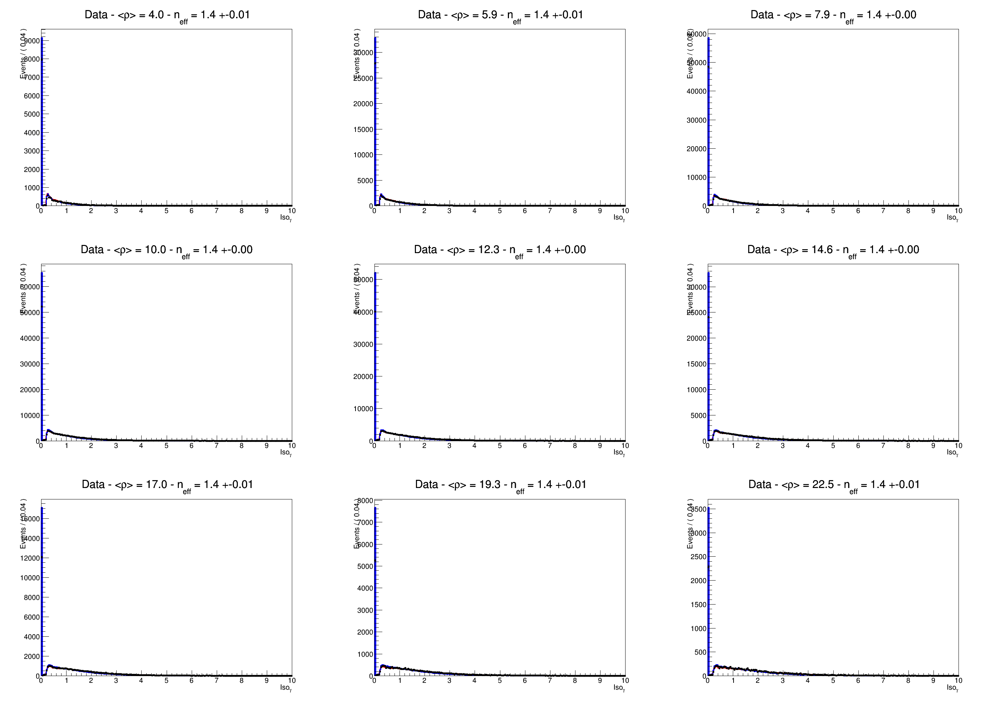

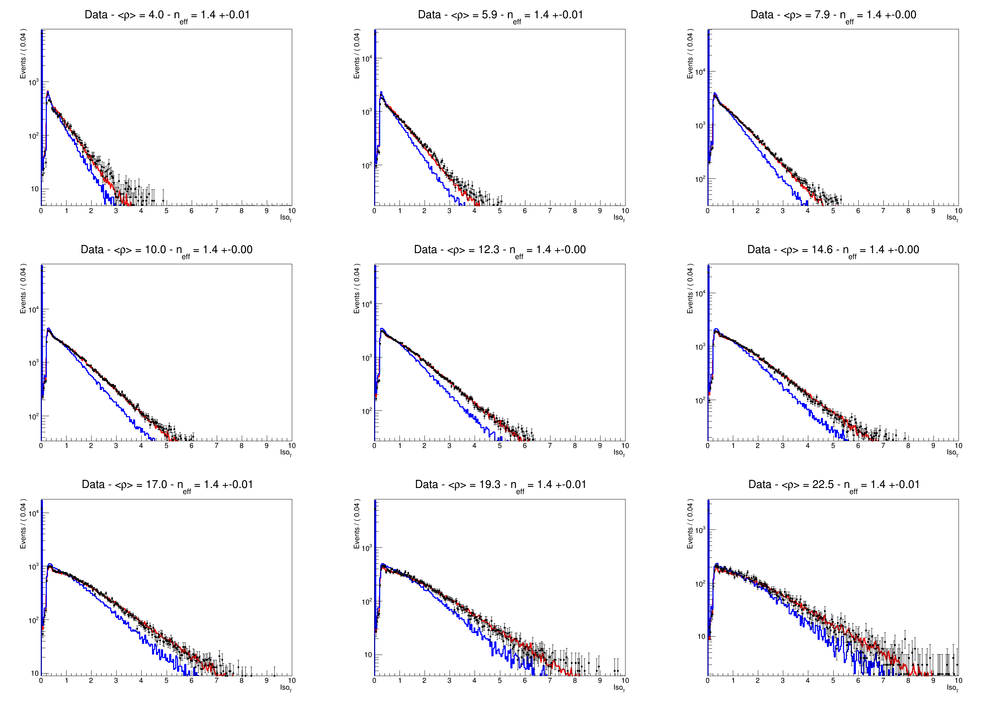

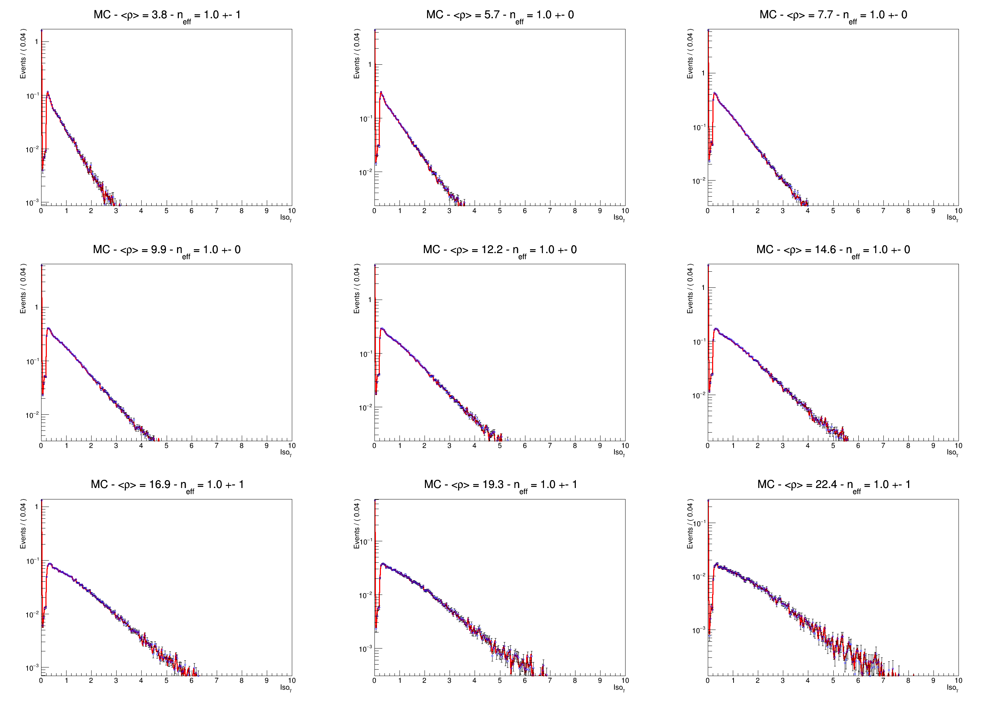

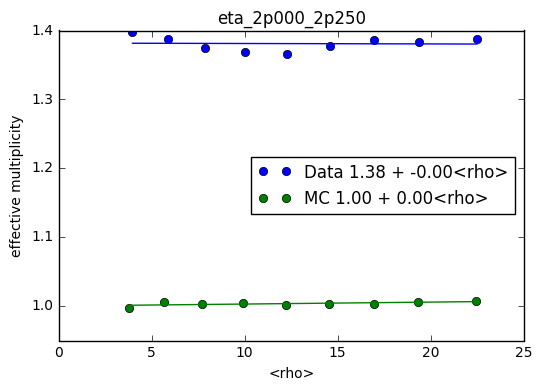

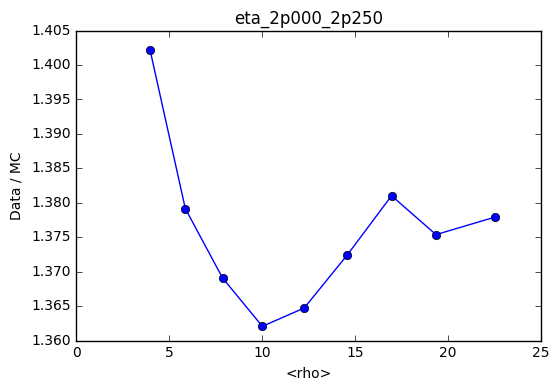

[output:16]

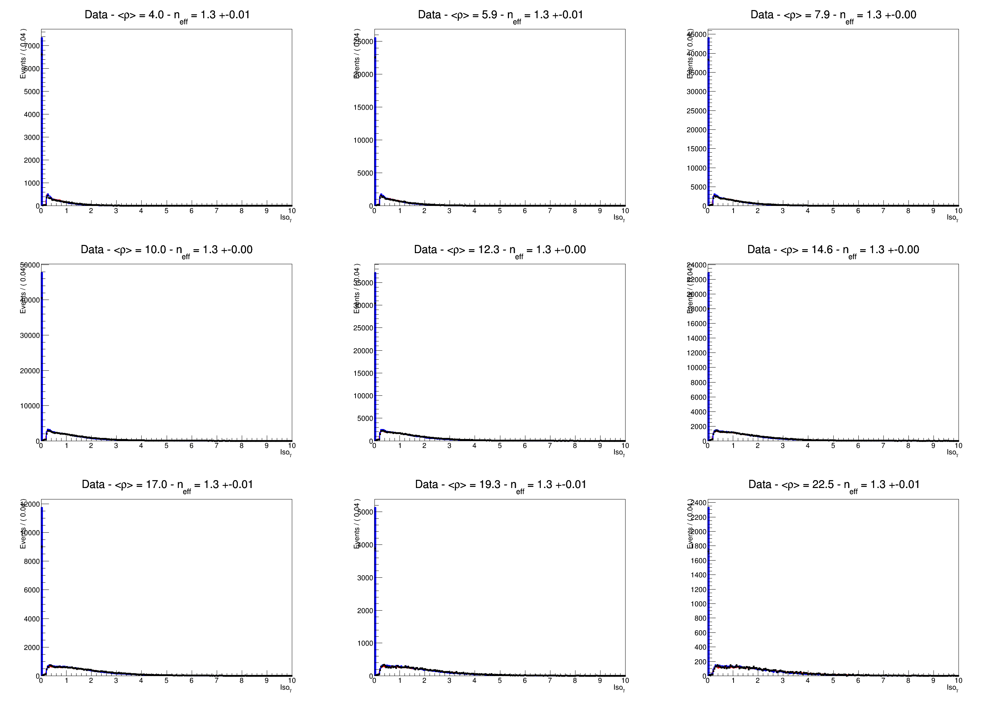

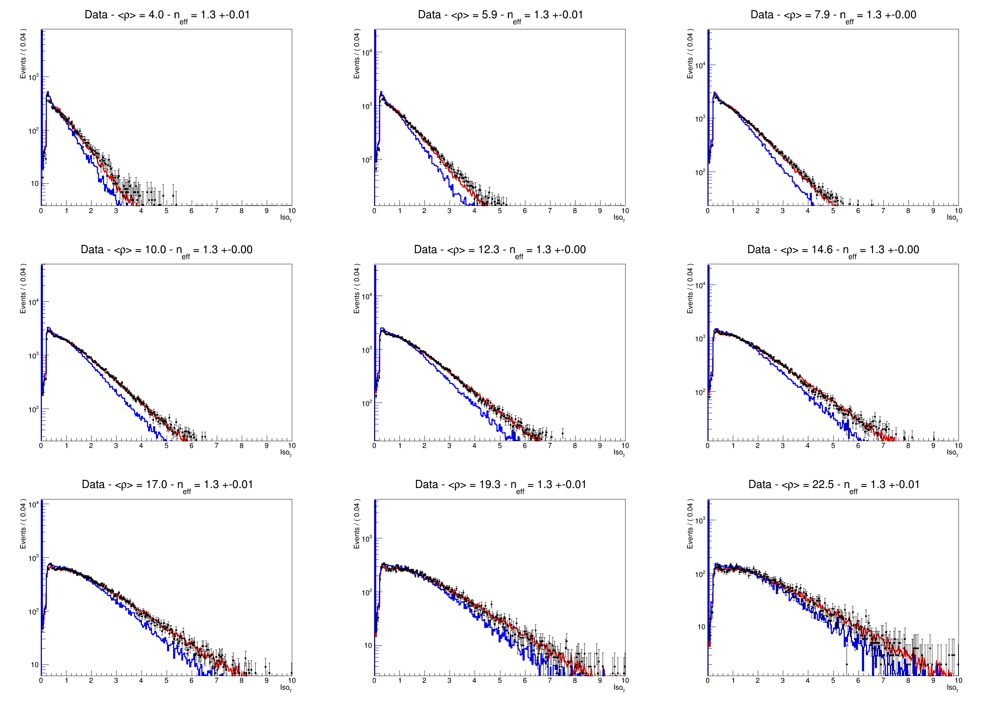

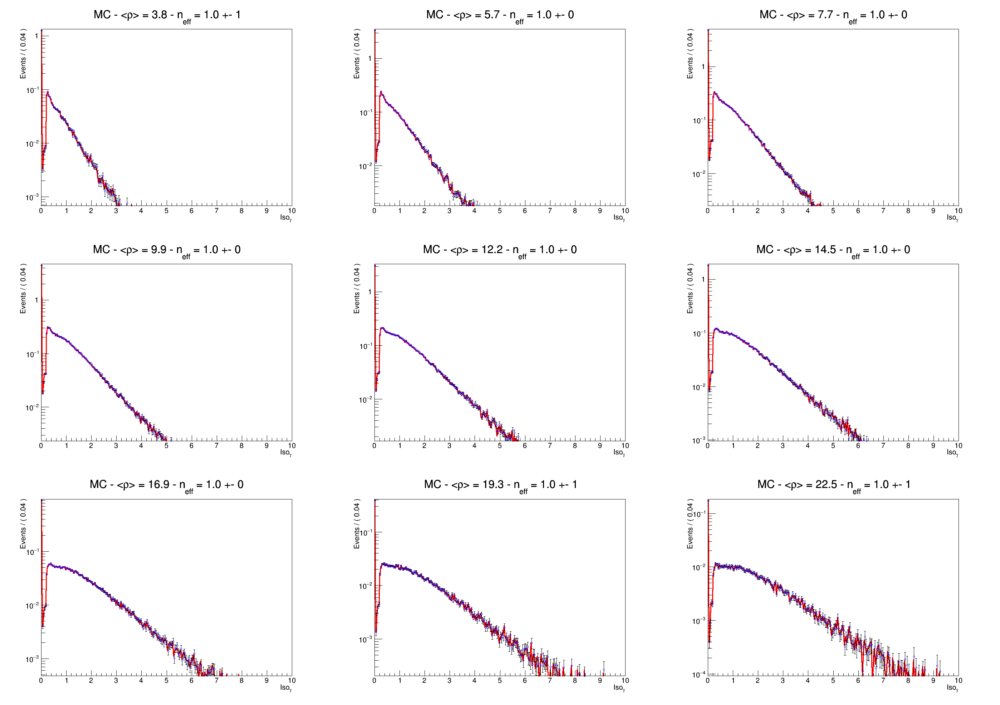

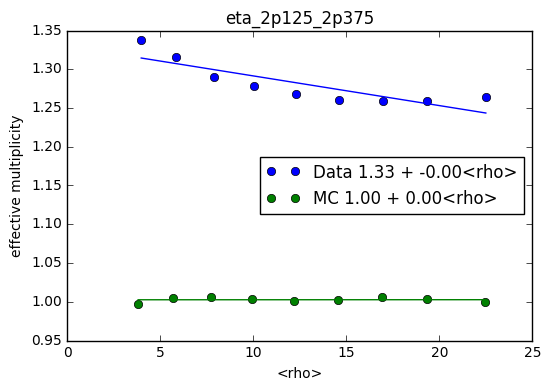

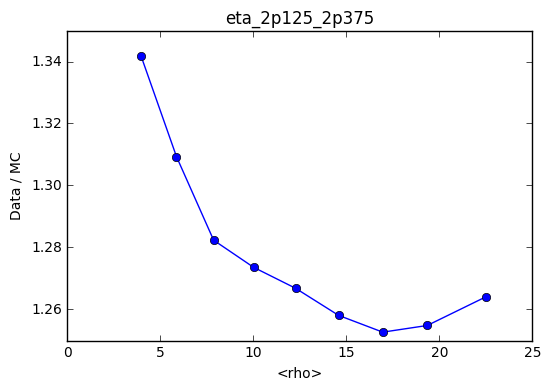

[output:17]

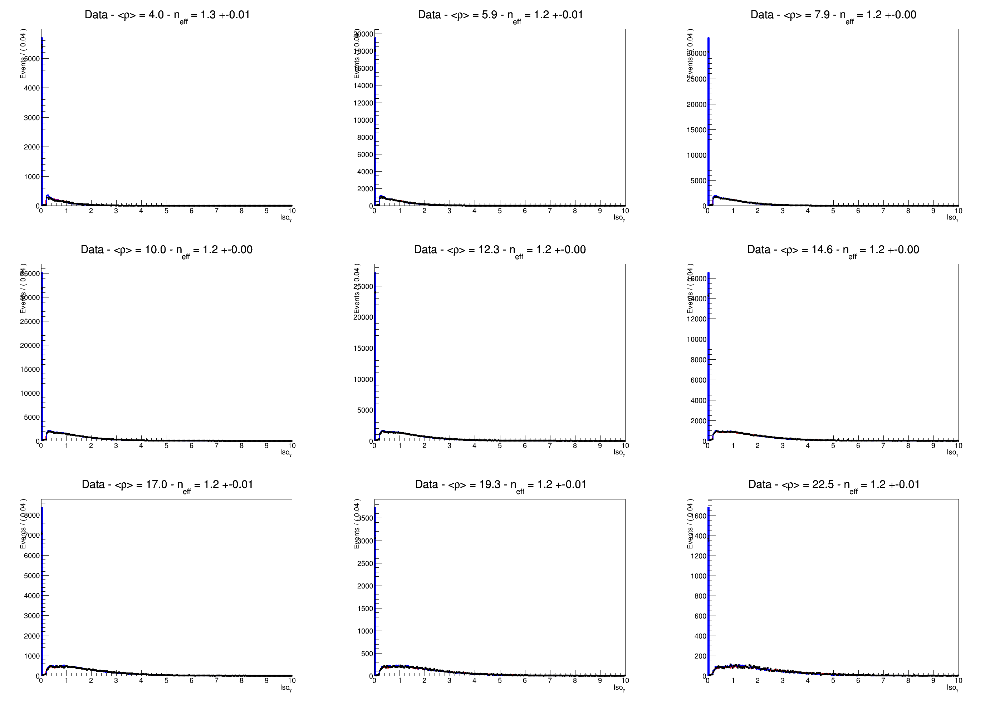

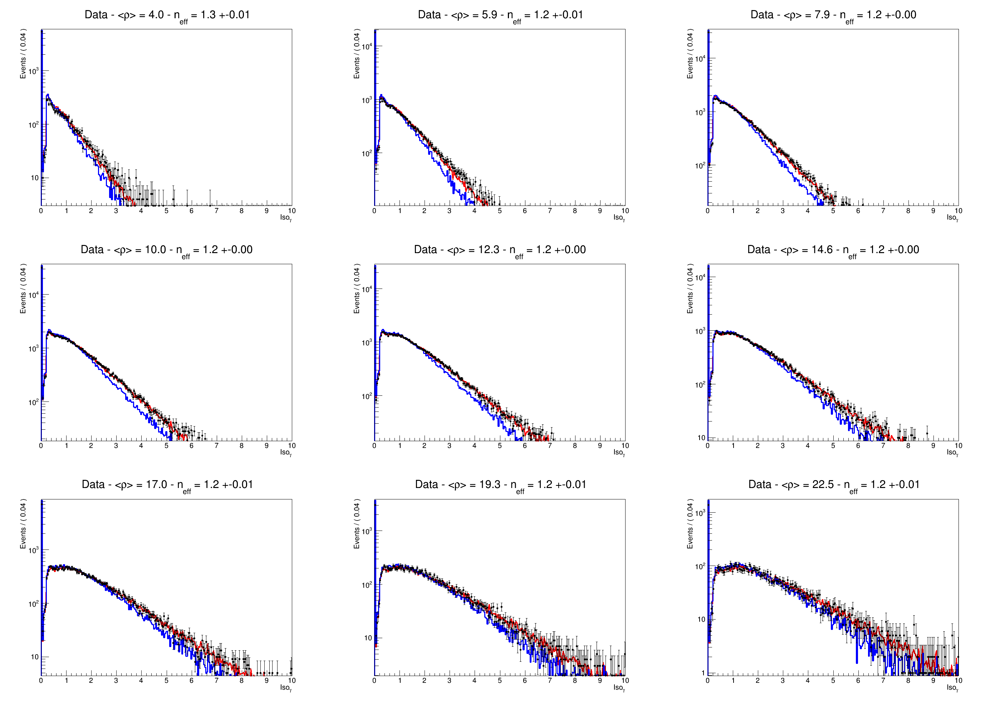

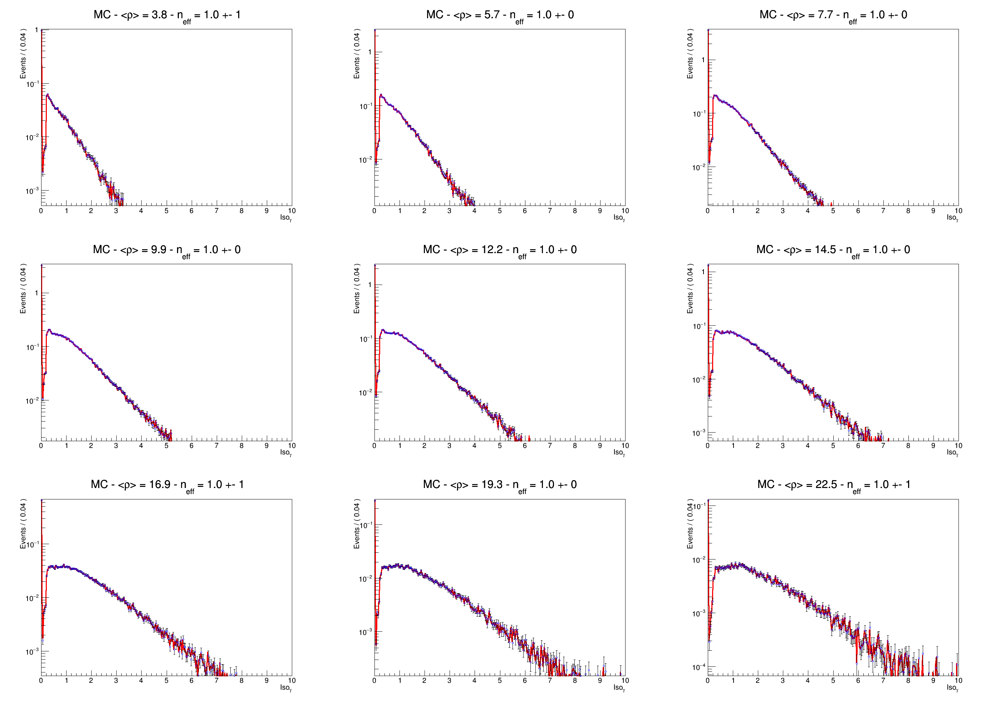

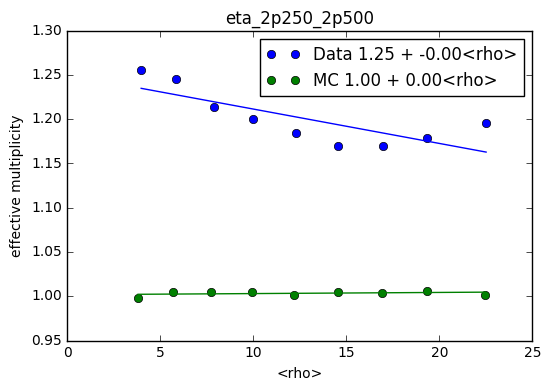

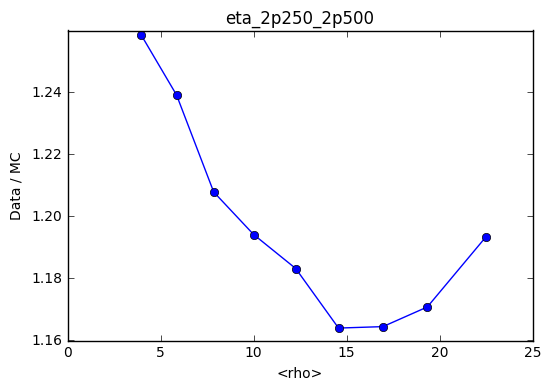

Out[0:1]: 
('eta_0p000_0p250',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.3680863 ,  1.37083048,  1.36615871,  1.36486612,  1.3718901 ,
         1.3691656 ,  1.36962191,  1.3630455 ,  1.36709022,  1.37182666,
         1.38042202,  1.37743235,  1.38150982,  1.36880641]),
 array([ 1.00102051,  1.00732598,  1.00507943,  1.0052156 ,  0.9982973 ,
         1.00377911,  1.00432166,  1.00644684,  1.00068284,  1.00335371,
         1.00092858,  1.00028818,  1.00288651,  1.00126744]),
 array([  3.98481988,   5.18448731,   6.43878405,   7.74569958,
          9.09027353,  10.47059138,  11.87572285,  13.29579943,
         14.72646316,  16.17717503,  17.62829583,  19.08871102,
         20.55211187,  22.93650929]),
 array([  3.82157242,   5.01966489,   6.298586  ,   7.62954548,
          9.00441752,  10.40899828,  11.826881  ,  13.26197605,
         14.70690232,  16.15598551,  17.61568177,  19.07897855,
         20.5350918 ,  22.92338509]),
 0.00027795354734202479,
 1.3712086583658845,
 -0.00015553961989

Out[1:1]: 
('eta_0p125_0p375',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.35974695,  1.36806657,  1.36451648,  1.36124425,  1.36857043,
         1.36800097,  1.36682987,  1.35763036,  1.36185674,  1.36442416,
         1.37576003,  1.38036638,  1.3891221 ,  1.37198055]),
 array([ 1.00009519,  1.00728975,  1.00410031,  1.00522068,  0.9983046 ,
         1.0035164 ,  1.00433965,  1.00699565,  1.00039617,  1.00352288,
         1.00229346,  1.00083605,  1.00249152,  1.00088382]),
 array([  3.98638006,   5.18202112,   6.44001759,   7.74857147,
          9.09180183,  10.47221479,  11.87724662,  13.29496673,
         14.726689  ,  16.17401018,  17.62655489,  19.08834832,
         20.55283036,  22.93157508]),
 array([  3.81985345,   5.02050812,   6.29902757,   7.63329202,
          9.00448221,  10.40670829,  11.83072036,  13.26196902,
         14.70184108,  16.15742274,  17.62072928,  19.08226731,
         20.53288043,  22.91957948]),
 0.00074502321191991254,
 1.3628332134378625,
 -0.00011553800235

Out[2:1]: 
('eta_0p250_0p500',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.36829816,  1.36466675,  1.36149   ,  1.35962011,  1.3693602 ,
         1.36766126,  1.36168913,  1.35245188,  1.35841535,  1.35581192,
         1.36079349,  1.37179612,  1.37679321,  1.36825422]),
 array([ 0.99480728,  1.0075772 ,  1.00428989,  1.00462201,  0.9981386 ,
         1.00355932,  1.00412245,  1.00658949,  1.00009657,  1.00408641,
         1.00159676,  1.00019596,  1.00248376,  1.00083087]),
 array([  3.98595632,   5.18196914,   6.43917334,   7.74459201,
          9.09158912,  10.47312775,  11.87741525,  13.29425713,
         14.72882968,  16.1773537 ,  17.62704212,  19.09574772,
         20.55161156,  22.91488795]),
 array([  3.82047717,   5.02041877,   6.29829194,   7.63529829,
          9.00647665,  10.40596627,  11.82915806,  13.26290284,
         14.70355405,  16.1550953 ,  17.61962136,  19.08134158,
         20.53929343,  22.91764946]),
 0.00017739521386835261,
 1.3650135514082986,
 -2.95289587001293

Out[3:1]: 
('eta_0p375_0p625',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.35741818,  1.34840737,  1.35010481,  1.34374892,  1.35232121,
         1.35150167,  1.34668303,  1.34119222,  1.34568254,  1.35207396,
         1.3550225 ,  1.35791147,  1.34537518,  1.35008974]),
 array([ 1.00020286,  1.00663784,  1.00392302,  1.00469347,  0.99894061,
         1.00303044,  1.00473802,  1.0063642 ,  1.00042913,  1.00391304,
         1.00136206,  0.9999712 ,  1.00229963,  1.00075473]),
 array([  3.98206827,   5.18527432,   6.43838775,   7.74350766,
          9.09199475,  10.47232217,  11.87503541,  13.29612146,
         14.73246937,  16.17673147,  17.62528278,  19.09858352,
         20.56191322,  22.92590351]),
 array([  3.82221826,   5.02104697,   6.29703953,   7.63365564,
          9.00911106,  10.40770227,  11.82677134,  13.2630052 ,
         14.70626634,  16.15409148,  17.61529179,  19.07644444,
         20.54561876,  22.92625796]),
 -0.00016874151464015021,
 1.355569156307989,
 -0.00012721572883

Out[4:1]: 
('eta_0p500_0p750',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.32603043,  1.31144516,  1.3216769 ,  1.32760404,  1.33466671,
         1.33066496,  1.32588497,  1.32698161,  1.33520745,  1.34853435,
         1.34804961,  1.3454837 ,  1.32855582,  1.32955727]),
 array([ 0.99533525,  1.00672501,  1.00350539,  1.00493654,  0.99915504,
         1.00353906,  1.00410683,  1.00676928,  1.00031834,  1.00383001,
         1.00176102,  0.99989726,  1.00183133,  1.00519391]),
 array([  3.9875982 ,   5.18638436,   6.436405  ,   7.74721819,
          9.09593056,  10.469861  ,  11.8712058 ,  13.29503052,
         14.73281769,  16.17917727,  17.62774821,  19.09339293,
         20.56031928,  22.93507982]),
 array([  3.82173293,   5.02118932,   6.29481857,   7.63255768,
          9.01135291,  10.40898232,  11.82766405,  13.26162966,
         14.70561615,  16.15621235,  17.61096862,  19.07901471,
         20.54741619,  22.91844461]),
 0.0010831314598471601,
 1.3210871797758783,
 5.4196433951262017

Out[5:1]: 
('eta_0p625_0p875',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.32323912,  1.3076544 ,  1.31585203,  1.32277506,  1.32989141,
         1.32482211,  1.31984324,  1.32143326,  1.32993955,  1.33840019,
         1.33264033,  1.33546616,  1.34287723,  1.33119135]),
 array([ 0.99554004,  1.00701418,  1.00385613,  1.00506176,  0.9996894 ,
         1.00301294,  1.00413885,  1.00655225,  1.00023963,  1.00383154,
         1.00141096,  0.99982685,  1.00245551,  1.00528897]),
 array([  3.99347105,   5.18703106,   6.4357136 ,   7.74588213,
          9.0956273 ,  10.47013362,  11.87091362,  13.29123876,
         14.72892005,  16.18800354,  17.63118959,  19.08017486,
         20.54876518,  22.92888932]),
 array([  3.82296523,   5.02281709,   6.29584272,   7.63197166,
          9.0100947 ,  10.40891815,  11.82889378,  13.26195588,
         14.70430083,  16.15608082,  17.61317802,  19.07979051,
         20.54946522,  22.90925659]),
 0.0012782225398965037,
 1.314081918287773,
 4.4993703560501838e

Out[6:1]: 
('eta_0p750_1p000',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.33901642,  1.31616804,  1.32367143,  1.3239642 ,  1.33036853,
         1.32313685,  1.3187902 ,  1.31612163,  1.32805981,  1.33244956,
         1.32736   ,  1.32549796,  1.34188514,  1.33381111]),
 array([ 0.99562338,  1.00640489,  1.00375932,  1.00508228,  0.99893144,
         1.00316147,  1.00376128,  1.00616572,  1.00018243,  1.0031737 ,
         1.00121072,  1.00044014,  1.00192001,  1.00375096]),
 array([  3.99000683,   5.19116759,   6.43923128,   7.74240807,
          9.09376204,  10.47552019,  11.87227157,  13.29034264,
         14.72789836,  16.18690879,  17.62567426,  19.07318913,
         20.55451506,  22.95660397]),
 array([  3.81812934,   5.02412585,   6.30007124,   7.63265979,
          9.00664994,  10.40955357,  11.82915667,  13.26067045,
         14.70343428,  16.15895517,  17.6167439 ,  19.07791564,
         20.54943214,  22.9007354 ]),
 0.00048160426551333675,
 1.324167150561899,
 1.9217701213311146

Out[7:1]: 
('eta_0p875_1p125',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.33722637,  1.31527999,  1.32090864,  1.32478373,  1.3280272 ,
         1.3244407 ,  1.32015744,  1.31774702,  1.33072737,  1.33231993,
         1.33252481,  1.32924497,  1.32563987,  1.33115396]),
 array([ 0.99726888,  1.00612541,  1.00294665,  1.00396665,  0.99934347,
         1.00256414,  1.00447933,  1.00591668,  0.99868137,  1.00323691,
         1.00119179,  0.99953015,  1.00566858,  1.00281727]),
 array([  3.98415393,   5.1854939 ,   6.4395489 ,   7.74580422,
          9.09270758,  10.47261132,  11.87378774,  13.29412964,
         14.72869511,  16.18315569,  17.62634405,  19.08402489,
         20.55824625,  22.94698686]),
 array([  3.81728613,   5.02300643,   6.29967175,   7.63454075,
          9.00799472,  10.40820512,  11.82821201,  13.26095131,
         14.70374257,  16.16020659,  17.61622181,  19.07807334,
         20.54908514,  22.90462942]),
 0.00037791595523908238,
 1.324787545008846,
 3.7626994386059119

Out[8:1]: 
('eta_1p000_1p250',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.32280844,  1.30762978,  1.31477617,  1.31753829,  1.32091268,
         1.32208516,  1.32127159,  1.32226697,  1.32967436,  1.33176845,
         1.33638268,  1.34025742,  1.34172567,  1.34142218]),
 array([ 0.99730805,  1.00536179,  1.00256663,  1.0041952 ,  0.99934056,
         1.00327329,  1.00402371,  1.0054716 ,  0.99853371,  1.00307485,
         1.00075344,  0.99986626,  1.00194662,  1.00363559]),
 array([  3.98290902,   5.17754042,   6.43693012,   7.75062367,
          9.09302586,  10.46893412,  11.87556748,  13.29701542,
         14.73113952,  16.17950994,  17.62971349,  19.09199958,
         20.55637596,  22.92478618]),
 array([  3.8197319 ,   5.022645  ,   6.2990118 ,   7.63427341,
          9.00823408,  10.4069585 ,  11.8268208 ,  13.26349398,
         14.70382791,  16.15762179,  17.61844823,  19.07702459,
         20.54168416,  22.92053506]),
 0.0016446739834926299,
 1.3081873101629129,
 3.1381487898642403

Out[9:1]: 
('eta_1p125_1p375',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.32684345,  1.30550413,  1.31308656,  1.31198886,  1.31514428,
         1.31533861,  1.31394551,  1.31469582,  1.32924625,  1.32951655,
         1.33623223,  1.33951605,  1.33711182,  1.34065595]),
 array([ 0.99712308,  1.00499826,  1.00262329,  1.00427388,  0.99950572,
         1.0032668 ,  1.00415379,  1.00603422,  0.99865424,  1.00318767,
         1.0010018 ,  0.99996052,  1.00229114,  1.00325266]),
 array([  3.98202086,   5.17947524,   6.43866063,   7.74935719,
          9.09542116,  10.47255792,  11.87462474,  13.29722226,
         14.73611823,  16.17502006,  17.62490993,  19.08962985,
         20.55373439,  22.95237961]),
 array([  3.82318551,   5.02368835,   6.29746833,   7.63273325,
          9.00916105,  10.40987959,  11.826219  ,  13.262469  ,
         14.706302  ,  16.15739562,  17.617022  ,  19.07534708,
         20.53705518,  22.92327662]),
 0.0016616329875530614,
 1.3050702403184402,
 1.2615865965249492

Out[10:1]: 
('eta_1p250_1p500',
 28,
 0.0,
 10.0,
 True,
 0,
 array([ 1.35955731,  1.31326117,  1.31539346,  1.31608009,  1.31629127,
         1.3163193 ,  1.31427571,  1.31345072,  1.3248953 ,  1.32421249,
         1.32863301,  1.32455483,  1.31618387,  1.33718591]),
 array([ 0.99684613,  1.00628181,  1.00355586,  1.00453167,  1.00004162,
         1.00324004,  1.00391154,  1.00623261,  1.00045041,  1.00367274,
         1.00169565,  0.9995039 ,  1.00533105,  1.0034477 ]),
 array([  3.98807839,   5.18695676,   6.43921709,   7.74480466,
          9.09712819,  10.47250257,  11.87614242,  13.29850557,
         14.73521892,  16.17114801,  17.6274856 ,  19.09318628,
         20.54758852,  22.97888796]),
 array([  3.82387283,   5.02520876,   6.29532593,   7.63208162,
          9.00978889,  10.40965839,  11.82889697,  13.26034145,
         14.7072974 ,  16.16004734,  17.61148718,  19.0764534 ,
         20.54459457,  22.91907236]),
 9.7170469103695917e-05,
 1.3252720565329681,
 4.45521185125168

Out[11:1]: 
('eta_1p500_1p750',
 18,
 0.0,
 10.0,
 True,
 0,
 array([ 1.43550038,  1.4276104 ,  1.41886572,  1.41262915,  1.42449632,
         1.42419068,  1.42178638,  1.41817337,  1.44124833]),
 array([ 0.99966499,  1.00782126,  1.00596437,  1.0065096 ,  1.00134899,
         1.00465217,  1.00960022,  1.01095318,  1.00348509]),
 array([  3.98316819,   5.87599881,   7.87568669,  10.01867139,
         12.26224227,  14.587048  ,  16.9485926 ,  19.3437082 ,  22.49735033]),
 array([  3.80240937,   5.66216293,   7.70712946,   9.90627055,
         12.20042608,  14.55444145,  16.92559017,  19.3398756 ,  22.44254887]),
 0.00045733660658576325,
 1.4270820421401611,
 0.00020191949176874194,
 1.0030306330953214,
 [[<ROOT.TH1D object ("hdata_eta_1p500_1p750_0p00_5p00") at 0x76764f0>,
   <ROOT.TH1D object ("hdata_eta_1p500_1p750_2p50_7p50") at 0x781a820>,
   <ROOT.TH1D object ("hdata_eta_1p500_1p750_5p00_10p00") at 0x77e1e00>,
   <ROOT.TH1D object ("hdata_eta_1p500_1p750_7p50_12p50") at 0x77e4270>,

Out[12:1]: 
('eta_1p625_1p875',
 18,
 0.0,
 10.0,
 True,
 0,
 array([ 1.46539112,  1.44759698,  1.44187343,  1.44034474,  1.4482521 ,
         1.4408469 ,  1.43850364,  1.43165892,  1.44098312]),
 array([ 1.00052525,  1.00801073,  1.00533242,  1.00657879,  1.00106826,
         1.00438217,  1.01025323,  1.01194015,  1.00262347]),
 array([  3.97832774,   5.87380245,   7.87515526,  10.0149257 ,
         12.26309082,  14.57954742,  16.94914108,  19.34502895,  22.46413367]),
 array([  3.80270725,   5.66439548,   7.70811365,   9.90698589,
         12.19856727,  14.55072241,  16.92551679,  19.34259234,  22.42880169]),
 -0.00079531635884348489,
 1.4620677902064656,
 0.00018576163940325547,
 1.0033123361290204,
 [[<ROOT.TH1D object ("hdata_eta_1p625_1p875_0p00_5p00") at 0x69b0120>,
   <ROOT.TH1D object ("hdata_eta_1p625_1p875_2p50_7p50") at 0x6b1eae0>,
   <ROOT.TH1D object ("hdata_eta_1p625_1p875_5p00_10p00") at 0x6b17a50>,
   <ROOT.TH1D object ("hdata_eta_1p625_1p875_7p50_12p50") at 0x6a60e20>

Out[13:1]: 
('eta_1p750_2p000',
 18,
 0.0,
 10.0,
 True,
 0,
 array([ 1.47438384,  1.45493443,  1.45988787,  1.45438306,  1.45649465,
         1.4598767 ,  1.46810506,  1.45767523,  1.4627607 ]),
 array([ 1.00035846,  1.00806289,  1.00533535,  1.00571546,  1.0002573 ,
         1.00472846,  1.01031365,  1.01143334,  1.00338694]),
 array([  3.97332073,   5.87163257,   7.86855899,  10.00900195,
         12.26123893,  14.58564843,  16.94731685,  19.3404552 ,  22.51089668]),
 array([  3.80064744,   5.66662699,   7.70364898,   9.9064607 ,
         12.20075778,  14.54622649,  16.92290261,  19.3433134 ,  22.44725958]),
 0.00022891479630688034,
 1.4661056096601801,
 0.00021232706374395437,
 1.0028552235520476,
 [[<ROOT.TH1D object ("hdata_eta_1p750_2p000_0p00_5p00") at 0x6fb4240>,
   <ROOT.TH1D object ("hdata_eta_1p750_2p000_2p50_7p50") at 0x7122840>,
   <ROOT.TH1D object ("hdata_eta_1p750_2p000_5p00_10p00") at 0x711df50>,
   <ROOT.TH1D object ("hdata_eta_1p750_2p000_7p50_12p50") at 0x711bd40>,

Out[14:1]: 
('eta_1p875_2p125',
 18,
 0.0,
 10.0,
 True,
 0,
 array([ 1.44113756,  1.43391078,  1.43707347,  1.43651407,  1.43807195,
         1.44974505,  1.46376388,  1.45997073,  1.4762843 ]),
 array([ 0.99557539,  1.00770875,  1.0043081 ,  1.00478998,  1.00035873,
         1.00454257,  1.0089128 ,  1.00921076,  1.00209285]),
 array([  3.96986612,   5.87181794,   7.86900336,  10.00908302,
         12.2630122 ,  14.59086772,  16.95525122,  19.34239247,  22.54760575]),
 array([  3.80285925,   5.65844922,   7.70106445,   9.90896544,
         12.20202077,  14.54863545,  16.92745733,  19.3406948 ,  22.45587198]),
 0.0025216203064880867,
 1.4227673632341433,
 0.00026388481148071046,
 1.0008667488725276,
 [[<ROOT.TH1D object ("hdata_eta_1p875_2p125_0p00_5p00") at 0x73ed9c0>,
   <ROOT.TH1D object ("hdata_eta_1p875_2p125_2p50_7p50") at 0x7556dd0>,
   <ROOT.TH1D object ("hdata_eta_1p875_2p125_5p00_10p00") at 0x7589ee0>,
   <ROOT.TH1D object ("hdata_eta_1p875_2p125_7p50_12p50") at 0x7549070>,


Out[15:1]: 
('eta_2p000_2p250',
 18,
 0.0,
 10.0,
 True,
 0,
 array([ 1.40222634,  1.37915087,  1.36908025,  1.36205661,  1.36472085,
         1.37245486,  1.38101654,  1.37537076,  1.37789363]),
 array([ 0.99664355,  1.00606421,  1.00356159,  1.00494779,  1.00120041,
         1.00369476,  1.00354908,  1.00594389,  1.00703522]),
 array([  3.96999747,   5.87088588,   7.87186752,  10.01190288,
         12.26377167,  14.58931778,  16.95834344,  19.34830529,  22.49817251]),
 array([  3.80416841,   5.65386799,   7.70355685,   9.90759981,
         12.2015132 ,  14.55270641,  16.93487528,  19.33441008,  22.44926145]),
 -6.2414860484402362e-05,
 1.3817554434751853,
 0.00028331229250016593,
 1.0000839979665896,
 [[<ROOT.TH1D object ("hdata_eta_2p000_2p250_0p00_5p00") at 0x76e5710>,
   <ROOT.TH1D object ("hdata_eta_2p000_2p250_2p50_7p50") at 0x78496f0>,
   <ROOT.TH1D object ("hdata_eta_2p000_2p250_5p00_10p00") at 0x784bb60>,
   <ROOT.TH1D object ("hdata_eta_2p000_2p250_7p50_12p50") at 0x7845450>

Out[16:1]: 
('eta_2p125_2p375',
 18,
 0.0,
 10.0,
 True,
 0,
 array([ 1.34161709,  1.30934012,  1.28235078,  1.27361463,  1.26685963,
         1.25809864,  1.25269009,  1.2548467 ,  1.26407694]),
 array([ 0.99697273,  1.00517281,  1.00580868,  1.00376353,  1.00121934,
         1.00192887,  1.00552234,  1.00306335,  0.99992267]),
 array([  3.97049174,   5.8648567 ,   7.86388571,  10.01051646,
         12.26489102,  14.58473194,  16.95656523,  19.34890432,  22.49753278]),
 array([  3.80343609,   5.65811816,   7.70452469,   9.90583674,
         12.20269418,  14.54485919,  16.9363753 ,  19.33289961,  22.45381037]),
 -0.0038291585401293636,
 1.3296851372139915,
 4.5007372085267311e-06,
 1.0025408667179023,
 [[<ROOT.TH1D object ("hdata_eta_2p125_2p375_0p00_5p00") at 0x7214bf0>,
   <ROOT.TH1D object ("hdata_eta_2p125_2p375_2p50_7p50") at 0x7370cc0>,
   <ROOT.TH1D object ("hdata_eta_2p125_2p375_5p00_10p00") at 0x73b1860>,
   <ROOT.TH1D object ("hdata_eta_2p125_2p375_7p50_12p50") at 0x73445a0>,

Out[17:1]: 
('eta_2p250_2p500',
 18,
 0.0,
 10.0,
 True,
 0,
 array([ 1.25849726,  1.23918669,  1.20790532,  1.19419049,  1.18322012,
         1.16400932,  1.16447865,  1.1708178 ,  1.19354011]),
 array([ 0.99775816,  1.00459481,  1.00447416,  1.00487415,  1.00093411,
         1.0049311 ,  1.00415871,  1.00635471,  1.00161917]),
 array([  3.96773364,   5.86363657,   7.86016461,  10.00659188,
         12.26982674,  14.57161491,  16.95904041,  19.34530793,  22.51189058]),
 array([  3.79876025,   5.66001792,   7.71011755,   9.90921022,
         12.19921118,  14.54124546,  16.93483672,  19.32993236,  22.47321461]),
 -0.0038809970279676991,
 1.2501041537721032,
 0.00012915255824216037,
 1.0016846776320243,
 [[<ROOT.TH1D object ("hdata_eta_2p250_2p500_0p00_5p00") at 0x5bd2b30>,
   <ROOT.TH1D object ("hdata_eta_2p250_2p500_2p50_7p50") at 0x5d78380>,
   <ROOT.TH1D object ("hdata_eta_2p250_2p500_5p00_10p00") at 0x5d76710>,
   <ROOT.TH1D object ("hdata_eta_2p250_2p500_7p50_12p50") at 0x5d363b0>,

In [21]:
%pxresult

In [22]:
# import photonIsoCorrect as pic

# reload(pic)
# pic.runEtaBin( *arg_list[0][1], **arg_list[0][2] )

In [23]:
results = dv.gather('result')
results

Welcome to ROOTaaS 6.06/08


<AsyncMapResult: gather>

In [24]:
results=list(results)
# ln = len(results)
# cs = 2
# results = map(lambda ii: results[ii:ii+cs], xrange(0,ln,cs))

In [25]:
mc_histos = reduce(lambda x,y: x+y, map(lambda x: x[-1][1], results))

In [26]:
for h in mc_histos:
    h.SetName(h.GetName().replace(".","p"))

In [108]:
final_rho_centers_ee = np.array(filter(lambda x: x>0 and x<=20, rho_centers_ee))
final_rho_centers_eb = np.array(filter(lambda x: x>0 and x<=21, rho_centers_eb))


In [109]:
final_rho_centers_eb, final_rho_centers_ee

(array([  1.5,   3. ,   4.5,   6. ,   7.5,   9. ,  10.5,  12. ,  13.5,
         15. ,  16.5,  18. ,  19.5,  21. ,  22.5,  24. ]),
 array([  2.5,   5. ,   7.5,  10. ,  12.5,  15. ,  17.5,  20. ]))

In [110]:
final_eta_centers = np.apply_along_axis(np.mean,1,eta_overlap_regions)

In [111]:
final_eta_centers

array([ 0.125,  0.25 ,  0.375,  0.5  ,  0.625,  0.75 ,  0.875,  1.   ,
        1.125,  1.25 ,  1.375,  1.625,  1.75 ,  1.875,  2.   ,  2.125,
        2.25 ,  2.375])

In [112]:
rho_eb_coord = zip(final_rho_centers_eb,map(lambda x: ("%1.2f_%1.2f" % (x[0],x[1])).replace(".","p"), rho_overlap_regions_eb))
rho_ee_coord = zip(final_rho_centers_ee,map(lambda x: ("%1.2f_%1.2f" % (x[0],x[1])).replace(".","p"), rho_overlap_regions_ee))

def hists_coord(reg):
    eta_center,eta_label = reg
    
    coords = rho_eb_coord if eta_center < 1.5 else rho_ee_coord
    
    return map(lambda x: ((eta_center,x[0]),"%s_%s"%(eta_label,x[1])), coords )

all_hist_coords = reduce(lambda x,y: x+y, map(hists_coord, 
    zip(final_eta_centers,map(lambda x: ("eta_%1.3f_%1.3f" % (x[0],x[1])).replace(".","p"), eta_overlap_regions))))



In [113]:
histo_map = { h.GetName().replace("hmc_","") : h for h in mc_histos }

new_hists = []
for val in all_hist_coords:
    (eta, rho), name = val
    hist = histo_map.get(name)
    if not hist: continue
    hist.SetName(("hist_%1.3f_%1.2f" % (eta,rho)).replace(".","p"))


In [38]:
import pandas as pd

In [80]:
ireg = -1

def mk_record(row):
    etareg,nbins,isomin,isomax,sameMult,multOffset,multratio,multmc,rhodata,rhomc,mdata,qdata,mmc,qmc,__ = row
    deltamult = multOffset if sameMult else 10
    etamin,etamax = [ float(x) for x in etareg.replace("p",".").split("_")[1:] ]
    if etamax<=1.5:
        rhomin,rhomax =  rho_overlap_regions_eb[:,0],rho_overlap_regions_eb[:,1] 
    else:
        rhomin,rhomax = rho_overlap_regions_ee[:,0], rho_overlap_regions_ee[:,1]
    #print(etamin,etamax,rhomin,rhomax)
    global ireg
    ireg += 1
    for ii in xrange(multratio.size):
        yield [ireg,ii,etamin,etamax,isomin,isomax,rhomin[ii],rhomax[ii],rhodata[ii],rhomc[ii],deltamult,
               multmc[ii],multratio[ii],mdata,qdata,mmc,qmc] 

columns = np.vstack(map(lambda x: np.array(list(mk_record(x))),results)).transpose()

colnames = ["ireg","ibin","etamin","etamax","isomin","isomax","rhomin","rhomax","rhodata","rhomc","deltamult","multmc","multratio",
            "mdata","qdata","mmc","qmc"]

df = pd.DataFrame( { x[0]: x[1] for x in zip(colnames,columns) } )

df['eta'] = 0.5*(df['etamin']+df['etamax'])

df['fitmult'] = (df['mdata']- df['mmc'])*df['rhodata'] + df['qdata']  - df['qmc']
df['measmult'] = (df['multratio']-1.)*df['multmc']

df['resid'] = df['measmult'] - df['fitmult']

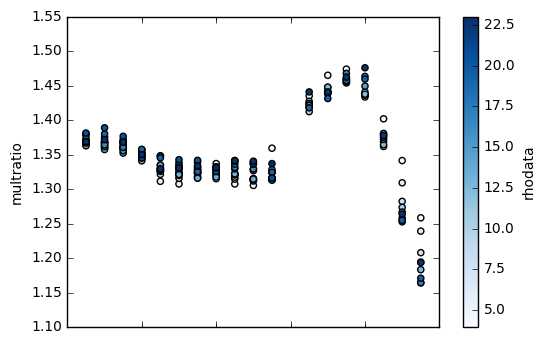

In [81]:
%matplotlib inline
import matplotlib.cm as cm

df.plot(kind='scatter',x='eta',y='multratio',c='rhodata',cmap=cm.Blues)



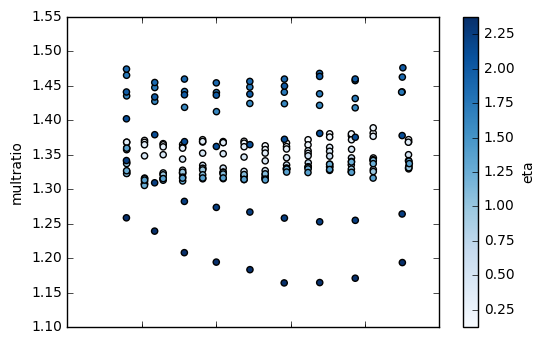

In [82]:
df.plot(kind='scatter',x='rhodata',y='multratio',c='eta',cmap=cm.Blues)

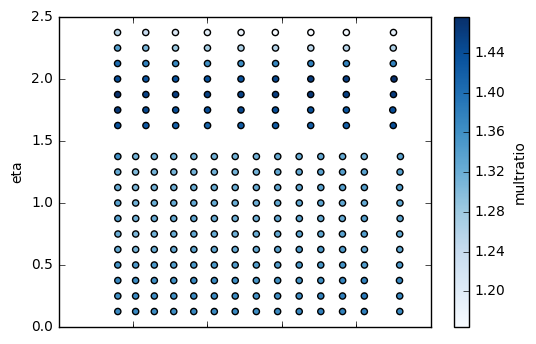

In [83]:
df.plot(kind='scatter',x='rhodata',y='eta',c='multratio',cmap=cm.Blues)

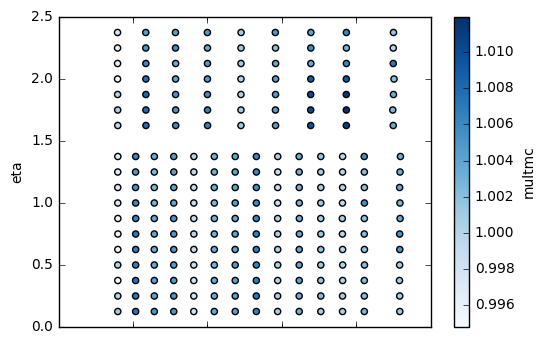

In [84]:
df.plot(kind='scatter',x='rhodata',y='eta',c='multmc',cmap=cm.Blues)

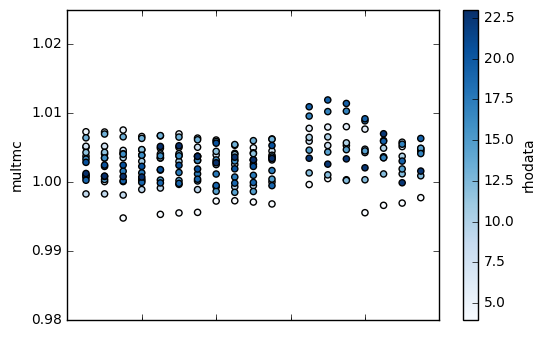

In [85]:
df.plot(kind='scatter',x='eta',y='multmc',c='rhodata',cmap=cm.Blues)

(-0.05, 0.05)

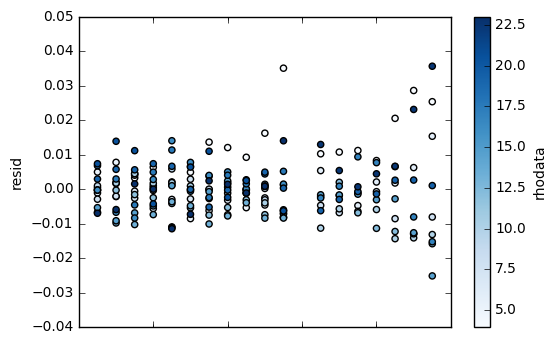

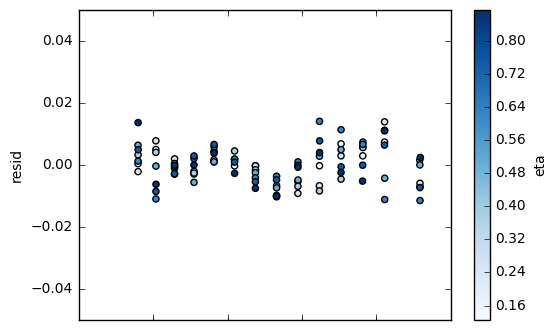

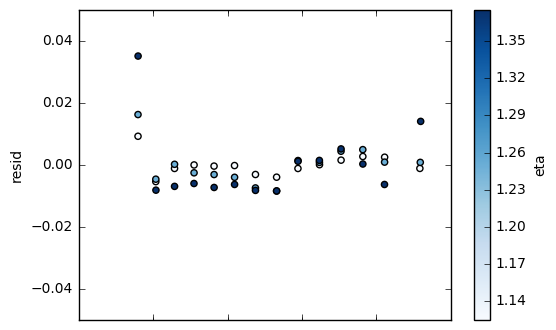

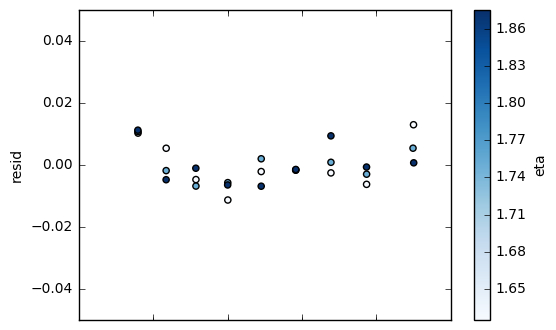

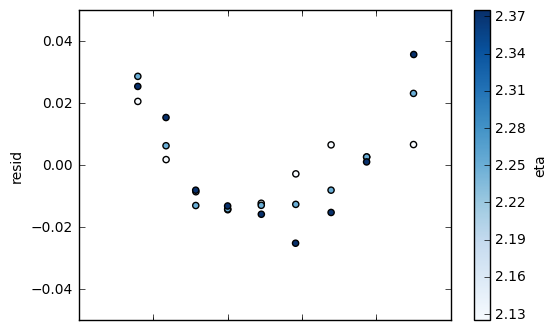

In [86]:
df.plot(kind='scatter',x='eta',y='resid',c='rhodata',cmap=cm.Blues)

df.query('eta < 1').plot(kind='scatter',x='rhodata',y='resid',c='eta',cmap=cm.Blues).set_ylim(-0.05,0.05)
df.query('eta > 1 & eta < 1.5').plot(kind='scatter',x='rhodata',y='resid',c='eta',cmap=cm.Blues).set_ylim(-0.05,0.05)
df.query('eta > 1.5 & eta < 2').plot(kind='scatter',x='rhodata',y='resid',c='eta',cmap=cm.Blues).set_ylim(-0.05,0.05)
df.query('eta > 2').plot(kind='scatter',x='rhodata',y='resid',c='eta',cmap=cm.Blues).set_ylim(-0.05,0.05)

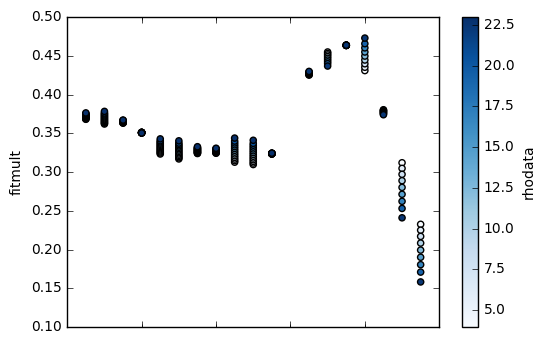

In [87]:

df.plot(kind='scatter',x='eta',y='fitmult',c='rhodata',cmap=cm.Blues)

(0.1, 0.5)

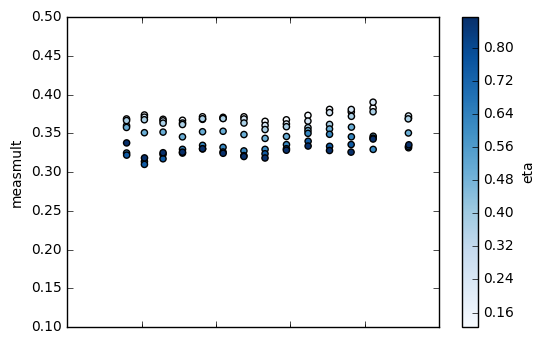

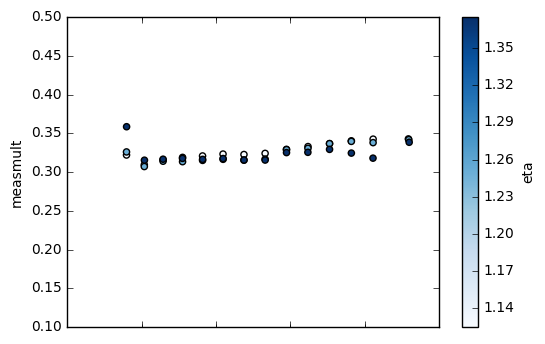

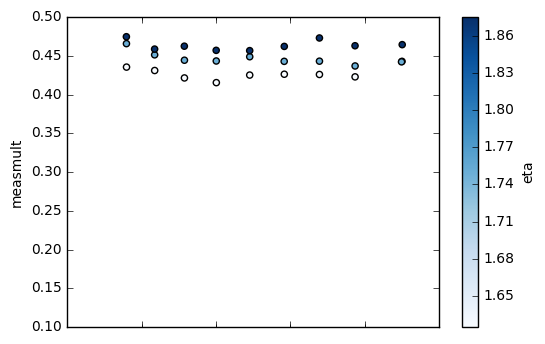

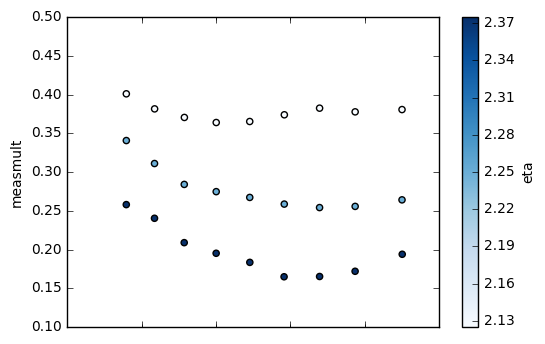

In [88]:
df.query('eta < 1').plot(kind='scatter',x='rhodata',y='measmult',c='eta',cmap=cm.Blues).set_ylim(0.1,0.5)
df.query('eta > 1 & eta < 1.5').plot(kind='scatter',x='rhodata',y='measmult',c='eta',cmap=cm.Blues).set_ylim(0.1,0.5)
df.query('eta > 1.5 & eta < 2').plot(kind='scatter',x='rhodata',y='measmult',c='eta',cmap=cm.Blues).set_ylim(0.1,0.5)
df.query('eta > 2').plot(kind='scatter',x='rhodata',y='measmult',c='eta',cmap=cm.Blues).set_ylim(0.1,0.5)

In [114]:
df0 = df.query('ibin==0')

extra_multiplicity = (df0['qdata'] - df0['qmc']).values
extra_multiplicity_slope = (df0['mdata'] - df0['mmc']).values
multiplicity_offset = df0['deltamult'].values


In [115]:
import ROOT as RT

In [116]:
root_eta_centers = RT.TVectorD(final_eta_centers.size,final_eta_centers)
root_rho_centers_eb = RT.TVectorD(final_rho_centers_eb.size,final_rho_centers_eb)
root_rho_centers_ee = RT.TVectorD(final_rho_centers_ee.size,final_rho_centers_ee)
root_extra_multiplicity = RT.TVectorD(extra_multiplicity.size,extra_multiplicity) 
root_extra_multiplicity_slope = RT.TVectorD(extra_multiplicity_slope.size,extra_multiplicity_slope) 
root_multiplicity_offset = RT.TVectorD(multiplicity_offset.size,multiplicity_offset) 


In [117]:
tout = RT.TFile.Open("corrections_slope.root","recreate")

for histo in mc_histos:
    histo.Clone().Write()

root_eta_centers.Write("eta_centers")
root_rho_centers_eb.Write("rho_centers_eb")
root_rho_centers_ee.Write("rho_centers_ee")
root_extra_multiplicity.Write("extra_multiplicity")
root_extra_multiplicity_slope.Write("extra_multiplicity_slope")
root_multiplicity_offset.Write("multiplicity_offset")

tout.Close()
